# 1. Imports

In [2]:
# Basic Libraries
import os  # File and directory management
import warnings  # Suppress warnings
import numpy as np  # Numerical operations
import pandas as pd  # Data manipulation and analysis
import scipy.stats as stats  # Statistical operations
warnings.filterwarnings('ignore')

# Data Visualization
import matplotlib.pyplot as plt  # Plotting
import seaborn as sns  # Advanced visualizations
from IPython.display import display, HTML  # Display utilities

# Preprocessing
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV, cross_val_score  # Splitting and validation
from sklearn.preprocessing import (
    StandardScaler, MinMaxScaler, LabelEncoder, OneHotEncoder, label_binarize
)  # Scaling and encoding
from sklearn.compose import ColumnTransformer  # Column transformations
from sklearn.pipeline import Pipeline  # Pipeline for preprocessing
from sklearn.impute import SimpleImputer  # Missing value imputation

# Model Evaluation Metrics
from sklearn.metrics import (
    accuracy_score, confusion_matrix, classification_report, roc_curve, auc,
    precision_score, recall_score, f1_score, roc_auc_score, silhouette_score
)

# Machine Learning Models
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA

# Advanced Models
import xgboost as xgb
from xgboost import XGBClassifier
from kneed import KneeLocator  # For optimal cluster selection
from imblearn.over_sampling import SMOTE  # Handling imbalanced data

# Deep Learning
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical

# Statistical Analysis
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# Clustering Utilities
from scipy.cluster.hierarchy import dendrogram, linkage, cut_tree
from scipy.optimize import linear_sum_assignment


from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples
import matplotlib.pyplot as plt
import seaborn as sns

# 2. Load Datasets

The code reads multiple CSV files containing cotton and rice crop data for the years 2021, 2022, and 2023. It uses the pd.read_csv() function from the pandas library to load each dataset into a separate DataFrame. Raw string literals (denoted by r) are used to handle file paths, ensuring that backslashes are correctly interpreted.

In [3]:
# Load datasets using raw strings
cotton2021 = pd.read_csv(r'Crop-dataset\Cotton\cotton2021.csv')
cotton2022 = pd.read_csv(r'Crop-dataset\Cotton\cotton2022.csv')
cotton2023 = pd.read_csv(r'Crop-dataset\Cotton\cotton2023.csv')

rice2021 = pd.read_csv(r'Crop-dataset\Rice\rice2021.csv')
rice2022 = pd.read_csv(r'Crop-dataset\Rice\rice2022.csv')
rice2023 = pd.read_csv(r'Crop-dataset\Rice\rice2023.csv')

# 3. Display Datasets Before Preprocessing

## 3.1. Display Cotton Dataset

### 3.1.1. Display 2021 Cotton Dataset

In [4]:
cotton2021

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12
0,0.153184,0.222615,0.498528,0.611280,0.285032,0.112775,0.529626,0.546617,0.604374,0.571359,0.620985,0.496628
1,0.137897,0.106036,0.169626,0.330396,0.594655,0.227967,0.578199,0.661604,0.783454,0.777313,0.729177,0.636792
2,0.122481,0.088123,0.182121,0.376037,0.431042,0.350422,0.630027,0.724557,0.844643,0.673307,0.736385,0.635118
3,0.085279,0.091887,0.140729,0.243528,0.224835,0.046875,0.579180,0.666857,0.611009,0.625423,0.612167,0.208681
4,0.091678,0.094313,0.247900,0.367800,0.546883,0.476697,0.699308,0.768818,0.753445,0.711491,0.707040,0.647931
...,...,...,...,...,...,...,...,...,...,...,...,...
2878,0.138030,0.329907,0.404328,0.537815,0.394826,0.113851,0.359073,0.649917,0.704158,0.726696,0.859813,0.355916
2879,0.523488,0.332649,0.226471,0.513300,0.600642,0.144718,0.612667,0.662235,0.560400,0.612191,0.804607,0.288965
2880,0.726984,0.400091,0.197898,0.247069,0.225268,0.082729,0.429161,0.774492,0.816801,0.853505,0.847405,0.730276
2881,0.265939,0.358320,0.435546,0.604886,0.475097,0.090206,0.519311,0.576597,0.691638,0.750179,0.758183,0.588785


### 3.1.2. Display 2022 Cotton Dataset

In [5]:
cotton2022

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12
0,0.088053,0.122912,0.203632,0.413183,0.824614,-0.012009,0.707493,0.553634,0.678005,0.601276,0.558074,0.264170
1,0.153362,0.306787,0.199341,0.344232,0.565855,-0.013706,0.512479,0.383124,0.508259,0.485459,0.426386,0.201609
2,0.106067,0.140156,0.328443,0.432596,0.567783,0.049462,0.738598,0.613374,0.881896,0.774641,0.718519,0.608508
3,0.091542,0.120096,0.244057,0.370085,0.502907,0.016404,0.617543,0.638213,0.856499,0.782228,0.730698,0.588019
4,0.080412,0.116872,0.291829,0.427347,0.688564,0.012112,0.517153,0.594714,0.845494,0.772517,0.730694,0.628959
...,...,...,...,...,...,...,...,...,...,...,...,...
12406,0.131888,0.113150,0.121260,0.114818,0.081116,0.001597,0.153307,0.304461,0.571842,0.608527,0.444227,0.364133
12407,0.185016,0.155825,0.146379,0.107036,0.067559,-0.020984,0.119457,0.178660,0.458241,0.513371,0.457156,0.394199
12408,0.122058,0.108996,0.126322,0.141570,0.128411,0.003110,0.165837,0.070270,0.196294,0.088979,0.081822,0.084518
12409,0.172523,0.168709,0.168362,0.139394,0.108651,-0.045763,0.254163,0.055743,0.131894,0.077957,0.081376,0.077510


### 3.1.3. Display 2023 Cotton Dataset

In [6]:
cotton2023

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12
0,0.112304,0.168831,0.357419,0.652470,0.511220,0.071754,0.746601,0.714075,0.747262,0.729675,0.634746,0.199640
1,0.111033,0.149460,0.360941,0.404814,0.385993,0.089474,0.647436,0.637131,0.677606,0.663667,0.581217,0.438363
2,0.102703,0.226310,0.554877,0.790602,0.812145,0.090364,0.866772,0.787777,0.838983,0.784251,0.711433,0.869757
3,0.090742,0.079962,0.355833,0.864751,0.837066,0.149301,0.890619,0.795135,0.834237,0.774393,0.683996,0.840936
4,0.100312,0.077954,0.328019,0.697031,0.722988,0.242764,0.869281,0.811822,0.836173,0.802686,0.700463,0.848245
...,...,...,...,...,...,...,...,...,...,...,...,...
11772,0.130143,0.108247,0.109874,0.177338,0.178003,0.092314,0.436729,0.753542,0.868271,0.834823,0.768142,0.470518
11773,0.565473,0.733032,0.280702,0.463700,0.737765,0.328413,0.229008,0.707480,0.875504,0.923436,0.852439,0.830161
11774,0.167851,0.204945,0.371220,0.378095,0.233630,0.287593,0.615308,0.655678,0.807842,0.835634,0.825262,0.797595
11775,0.152844,0.371162,0.582090,0.826781,0.881840,0.509232,0.730275,0.321719,0.767047,0.877766,0.866667,0.817833


## 3.2. Display Rice Datasets

### 3.2.1. Display 2021 Rice Dataset

In [7]:
rice2021

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12
0,0.098886,0.103672,0.238722,0.478474,0.429209,0.281007,0.605667,0.291368,0.133020,0.779261,0.818019,0.721222
1,0.118790,0.147110,0.218349,0.652877,0.513883,0.039530,0.702403,0.646029,0.162462,0.204209,0.363850,0.155452
2,0.181040,0.146681,0.227818,0.528602,0.413309,0.041322,0.671362,0.679732,0.602896,0.199579,0.373932,0.143989
3,0.220000,0.143860,0.197724,0.676182,0.534545,0.054701,0.706315,0.636900,0.216295,0.216854,0.239008,0.171939
4,0.113367,0.139415,0.411447,0.637250,0.466728,0.045908,0.691222,0.654271,0.589966,0.208658,0.211051,0.161702
...,...,...,...,...,...,...,...,...,...,...,...,...
414,0.174410,0.089574,0.409769,0.602472,0.360485,0.478802,0.669603,0.279522,0.186710,0.625578,0.933573,0.793798
415,0.124839,0.095548,0.392523,0.628841,0.453770,0.067350,0.591837,0.426808,0.712821,0.888472,0.899105,0.766911
416,0.161652,0.274931,0.581613,0.670435,0.428686,0.080011,0.217853,0.231816,0.460350,0.821652,0.829357,0.696429
417,0.141479,0.125532,0.159142,0.327632,0.307484,0.443808,0.674027,0.787402,0.780147,0.560878,0.274074,0.195003


### 3.2.2. Display 2022 Rice Dataset

In [8]:
rice2022

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12
0,0.442943,0.325107,0.448911,0.698456,1.000000,0.071374,0.714939,0.588107,0.571895,0.787698,0.816302,0.613884
1,0.128122,0.352554,0.533025,0.647528,1.000000,0.052378,0.534581,0.511706,0.562397,0.275249,0.553359,0.565554
2,0.400911,0.406091,0.443299,0.535024,0.978224,0.073414,0.387755,0.484515,0.605432,0.570827,0.636029,0.553675
3,0.390117,0.728009,0.760038,0.786063,1.000000,0.059971,0.555362,0.699239,0.893971,0.942492,0.869822,0.759206
4,0.117680,0.111500,0.102671,0.126739,0.144219,0.077910,0.204507,0.600983,0.762850,0.838978,0.824411,0.738954
...,...,...,...,...,...,...,...,...,...,...,...,...
4682,0.144404,0.130435,0.267739,0.273391,0.705258,0.608263,0.519339,0.483456,0.301149,0.184329,0.489453,0.671942
4683,0.144395,0.166874,0.304348,0.404255,0.654962,0.554571,0.747805,0.598974,0.739962,0.651039,0.542270,0.507232
4684,0.133390,0.277693,0.491424,0.733867,0.944731,0.686950,0.797565,0.593707,0.526810,0.454545,0.238906,0.218204
4685,0.103372,0.172175,0.415501,0.638936,0.612252,0.496590,0.510204,0.472645,0.386538,0.312476,0.273450,0.320506


### 3.2.3. Display 2023 Rice Dataset

In [9]:
rice2023

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12
0,0.219298,0.406830,0.620985,0.841141,0.982545,0.168539,0.784436,0.203078,0.182609,0.256804,0.381433,0.485466
1,0.290999,0.260493,0.473620,0.485981,0.650122,0.133713,1.000000,0.694864,0.665847,0.657620,0.687118,0.722555
2,0.119565,0.142857,0.124230,0.318060,0.185724,0.169022,0.510106,0.238587,0.101852,0.187604,0.160437,0.304826
3,0.242507,0.235010,0.282532,0.393004,0.318597,0.168026,0.767211,0.325995,0.232826,0.341040,0.331269,0.440540
4,0.312309,0.350049,0.657402,0.818031,0.982894,0.213175,0.591485,0.517812,0.670632,0.794137,0.791589,0.792854
...,...,...,...,...,...,...,...,...,...,...,...,...
914,0.331873,0.637595,0.860933,0.936457,0.771076,0.402954,0.884208,0.515337,0.851545,0.908714,0.895963,0.858908
915,0.333794,0.621409,0.841538,0.909154,0.736736,0.384046,0.886665,0.485586,0.846778,0.907973,0.904183,0.876847
916,0.373900,0.618582,0.856424,0.903326,0.781238,0.375578,0.889700,0.532434,0.844510,0.911383,0.905652,0.899614
917,0.349008,0.556529,0.855942,0.925486,0.800000,0.347044,0.895157,0.473819,0.812193,0.904762,0.899269,0.903632


# 4. Preprocessing

## 4.1. Combine Datasets Yearly

This code adds a new column called 'label' to each dataset, assigning a value of 0 for cotton and 1 for rice. Then, it combines the cotton and rice datasets for each year (2021, 2022, and 2023) into separate DataFrames (year_2021, year_2022, and year_2023) using pd.concat.








In [10]:
# Add a label column to each dataset (0 for cotton, 1 for rice)
cotton2021['label'] = 0
rice2021['label'] = 1
cotton2022['label'] = 0
rice2022['label'] = 1
cotton2023['label'] = 0
rice2023['label'] = 1

# Combine the datasets for each year
year_2021 = pd.concat([cotton2021, rice2021], ignore_index=True)
year_2022 = pd.concat([cotton2022, rice2022], ignore_index=True)
year_2023 = pd.concat([cotton2023, rice2023], ignore_index=True)

## 4.2 Scaling, Impute Missing Values, Drop Duplicates, Handle Outliers

The preprocess_dataset function cleans the dataset by filling missing numeric values with the median and removing outliers using the IQR method. This prepares the data for analysis or modeling.








In [11]:
# Preprocessing Function (without PCA)
def preprocess_dataset(dataset):
    """
    Preprocess a dataset by scaling, handling missing values, duplicates, and outliers.
    """
    dataset = dataset.copy()

    # Impute Missing Values
    num_cols = dataset.select_dtypes(include=[np.number]).columns
    dataset[num_cols] = dataset[num_cols].fillna(dataset[num_cols].median())

    # Handle Outliers using IQR
    Q1 = dataset[num_cols].quantile(0.25)
    Q3 = dataset[num_cols].quantile(0.75)
    IQR = Q3 - Q1
    dataset = dataset[~((dataset[num_cols] < (Q1 - 1.5 * IQR)) | 
                        (dataset[num_cols] > (Q3 + 1.5 * IQR))).any(axis=1)]

    return dataset

## 4.3. Apply Preprocessing On Yearly Datasets

This code applies the preprocess_dataset function to each individual dataset (cotton and rice for 2021, 2022, and 2023), cleaning them by handling missing values and outliers. Each dataset is processed and updated accordingly.

In [12]:
# Preprocess individual datasets
cotton2021 = preprocess_dataset(cotton2021)
rice2021 = preprocess_dataset(rice2021)

cotton2022 = preprocess_dataset(cotton2022)
rice2022 = preprocess_dataset(rice2022)

cotton2023 = preprocess_dataset(cotton2023)
rice2023 = preprocess_dataset(rice2023)

## 4.4. Apply Time-Series Augmentation

The sliding_window_augment function augments a time-series dataset by generating new rows using the mean of sliding windows of a specified size. It repeats this process until the dataset reaches the target size and then shuffles the result.

In [13]:
window_size = 3
def sliding_window_augment(dataset, target_size, window_size):
    """
    Augments a time-series dataset using a sliding window approach.
    
    Parameters:
    - dataset: pd.DataFrame, the input dataset (time-series format).
    - target_size: int, the desired number of rows after augmentation.
    - window_size: int, size of the sliding window.
    
    Returns:
    - augmented_data: pd.DataFrame, the augmented dataset.
    """
    augmented_data = dataset.copy()
    while len(augmented_data) < target_size:
        for i in range(len(dataset) - window_size + 1):
            window = dataset.iloc[i:i + window_size].mean(axis=0)
            augmented_data = pd.concat([augmented_data, window.to_frame().T], ignore_index=True)
            if len(augmented_data) >= target_size:
                break
    return augmented_data.sample(frac=1, random_state=42).reset_index(drop=True)


This code sets the target sizes for cotton and rice datasets. The target size for cotton is set to the length of the largest cotton dataset (from 2021, 2022, or 2023), and the target size for rice is set to the length of the largest rice dataset from the same years. These target sizes will be used for data augmentation.

In [14]:
# Set target sizes (matching the largest dataset for cotton and half of that for rice)
cotton_target_size = max(len(cotton2021), len(cotton2022), len(cotton2023))
rice_target_size =  max(len(rice2021), len(rice2022), len(rice2023))  

This code augments the cotton and rice datasets for 2021, 2022, and 2023 using the sliding_window_augment function. It adjusts each dataset to the target size, which is based on the largest dataset in each category (cotton and rice), and applies a sliding window approach to generate new rows. The window size used for augmentation is defined by the window_size variable.

In [15]:
# Augment datasets
cotton2021 = sliding_window_augment(cotton2021, cotton_target_size, window_size)
cotton2022 = sliding_window_augment(cotton2022, cotton_target_size, window_size)
cotton2023 = sliding_window_augment(cotton2023, cotton_target_size, window_size)

rice2021 = sliding_window_augment(rice2021, rice_target_size, window_size)
rice2022 = sliding_window_augment(rice2022, rice_target_size, window_size)
rice2023 = sliding_window_augment(rice2023, rice_target_size, window_size)

## 4.5. Labeling And Combining By Year

This code adds a 'label' column to each of the cotton and rice datasets for 2021, 2022, and 2023, where cotton is labeled as 0 and rice as 1. Then, it combines the cotton and rice datasets for each year (2021, 2022, and 2023) into a single DataFrame for each year (year_2021_combined, year_2022_combined, and year_2023_combined).








In [16]:
# Add labels to datasets
cotton2021['label'] = 0
rice2021['label'] = 1

cotton2022['label'] = 0
rice2022['label'] = 1

cotton2023['label'] = 0
rice2023['label'] = 1

# Combine datasets for each year
year_2021_combined = pd.concat([cotton2021, rice2021], ignore_index=True)
year_2022_combined = pd.concat([cotton2022, rice2022], ignore_index=True)
year_2023_combined = pd.concat([cotton2023, rice2023], ignore_index=True)

# 5. Display Yearly Datasets After Preprocessing

## 5.1. Display Year 2021

In [17]:
year_2021_combined

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12,label
0,0.139154,0.120600,0.202828,0.535964,0.448897,0.251601,0.639305,0.754117,0.815053,0.588922,0.591107,0.410043,0
1,0.110869,0.158941,0.226227,0.388306,0.390704,-0.025140,0.603319,0.688840,0.728110,0.620898,0.577879,0.434365,0
2,0.083802,0.117208,0.313253,0.345238,0.434418,0.521520,0.645583,0.715340,0.843185,0.770704,0.744372,0.629657,0
3,0.072851,0.098215,0.241690,0.452621,0.499747,0.550940,0.587174,0.640988,0.705940,0.646064,0.640693,0.458955,0
4,0.108623,0.109848,0.202008,0.321377,0.373759,0.410567,0.539081,0.606608,0.704127,0.669352,0.674184,0.590965,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12297,0.146909,0.103551,0.320478,0.519648,0.373913,0.329986,0.645156,0.497910,0.559893,0.691643,0.702250,0.585237,1
12298,0.173277,0.145884,0.214630,0.619220,0.487246,0.045184,0.693360,0.654220,0.327218,0.206881,0.325597,0.157127,1
12299,0.106093,0.131263,0.346535,0.562481,0.461343,0.121464,0.627311,0.457008,0.276063,0.289905,0.457093,0.343956,1
12300,0.106390,0.191093,0.576078,0.714441,0.432193,0.095178,0.551941,0.391149,0.749070,0.866650,0.797841,0.722641,1


## 5.2. Display Year 2022

In [18]:
year_2022_combined

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12,label
0,0.234568,0.181631,0.199049,0.226104,0.663804,0.007777,0.412271,0.431887,0.396474,0.399651,0.389332,0.513605,0
1,0.130468,0.217840,0.209964,0.172674,0.357785,0.034119,0.710200,0.593324,0.622378,0.224080,0.181135,0.311295,0
2,0.092110,0.100785,0.157762,0.202526,0.682021,0.172762,0.982024,0.733758,0.796935,0.701357,0.495044,0.421144,0
3,0.082202,0.102216,0.099320,0.114818,0.244995,0.202017,0.260599,0.567298,0.562050,0.704325,0.508937,0.150647,0
4,0.087197,0.115226,0.236465,0.505037,0.817423,0.355115,0.769674,0.573361,0.723096,0.715705,0.466825,0.350000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12297,0.110039,0.104770,0.268430,0.501481,0.728850,0.289875,0.755030,0.512620,0.624650,0.877416,0.895726,0.883573,1
12298,0.082659,0.067630,0.068100,0.066609,0.096530,-0.012883,0.718121,0.789757,0.859554,0.834158,0.792017,0.597959,1
12299,0.132755,0.099099,0.111712,0.107822,0.287788,0.152432,0.705036,0.930856,0.896907,0.968387,0.832998,0.683106,1
12300,0.167793,0.099271,0.105327,0.127382,0.258160,0.216122,0.488294,0.703608,0.878719,0.848554,0.722165,0.339574,1


## 5.3. Display Year 2023

In [19]:
year_2023_combined

,NDVI01,NDVI02,NDVI03,NDVI04,NDVI05,NDVI06,NDVI07,NDVI08,NDVI09,NDVI10,NDVI11,NDVI12,label
0,0.241632,0.151781,0.215420,0.189257,0.229397,0.237809,0.542878,0.560566,0.627929,0.641815,0.544343,0.569995,0
1,0.097253,0.110343,0.193227,0.292797,0.431942,0.647164,0.656133,0.645320,0.626016,0.681043,0.537680,0.378745,0
2,0.172032,0.144885,0.370976,0.527139,0.829302,0.397186,0.874948,0.727959,0.775811,0.696058,0.590922,0.377003,0
3,0.105784,0.099579,0.121681,0.239757,0.384494,0.286344,0.656595,0.739753,0.684211,0.723926,0.621748,0.730028,0
4,0.199229,0.093851,0.108269,0.252519,0.618255,-0.071796,0.918517,0.826120,0.735593,0.626676,0.537469,0.517129,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12297,0.170836,0.481302,0.766822,0.911422,0.924996,0.039519,0.536538,0.472352,0.826691,0.869603,0.822319,0.556479,1
12298,0.111874,0.550379,0.849456,0.885810,0.919148,-0.015001,0.187052,0.443689,0.753964,0.865509,0.852254,0.843237,1
12299,0.163835,0.383124,0.751110,0.874989,0.898358,0.440359,0.403877,0.562133,0.844953,0.888947,0.835343,0.749455,1
12300,0.224645,0.388847,0.409975,0.701295,0.909167,0.759526,0.805549,0.380492,0.412629,0.598396,0.714984,0.785775,1


# 6. Feature Engineering

## 6.1. Apply PCA

The preprocess_combined_with_pca function performs PCA on a combined dataset. It first separates features and labels, scales the features using standard scaling, and then applies PCA to reduce the dimensionality, capturing the specified variance threshold. The transformed features are stored in a DataFrame, with the label column added back. It returns the PCA-transformed dataset and the PCA model.








In [20]:
# Apply PCA on combined datasets
def preprocess_combined_with_pca(dataset, variance_threshold=0.80):
    """
    Apply PCA on a combined dataset (with label column).
    """
    dataset = dataset.copy()

    # Separate features and labels
    X = dataset.drop(columns=['label'])
    y = dataset['label']

    # Standard Scaling
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Apply PCA
    pca = PCA(n_components=variance_threshold)
    X_pca = pca.fit_transform(X_scaled)

    # Create PCA DataFrame
    pca_columns = [f'PCA{i+1}' for i in range(X_pca.shape[1])]
    pca_df = pd.DataFrame(X_pca, columns=pca_columns)
    pca_df['label'] = y.reset_index(drop=True)

    return pca_df, pca


This code applies the preprocess_combined_with_pca function to the combined datasets for 2021, 2022, and 2023. It retains 80% of the variance by setting the variance_threshold to 0.80. The PCA-transformed datasets (year_2021_pca, year_2022_pca, year_2023_pca) and the corresponding PCA models (pca_2021, pca_2022, pca_2023) are returned for each year.

In [21]:
# Apply preprocessing with PCA to datasets for each year
variance_threshold = 0.80  # Retain 80% of variance
# Apply PCA to combined datasets
year_2021_pca, pca_2021 = preprocess_combined_with_pca(year_2021_combined, variance_threshold)
year_2022_pca, pca_2022 = preprocess_combined_with_pca(year_2022_combined, variance_threshold)
year_2023_pca, pca_2023 = preprocess_combined_with_pca(year_2023_combined, variance_threshold)

## 6.2. Visualize Explained Variance For PCA

This code defines the plot_explained_variance function, which visualizes the cumulative explained variance ratio for PCA components. It plots the cumulative explained variance for each principal component, with a red dashed line indicating the 80% variance threshold. The function is then used to generate plots for each year's PCA (2021, 2022, and 2023). These plots help assess how much variance is explained by the selected components in each dataset.

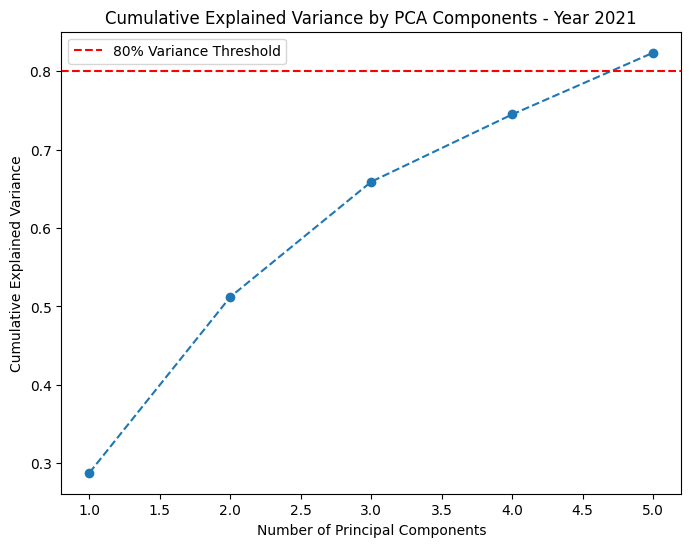

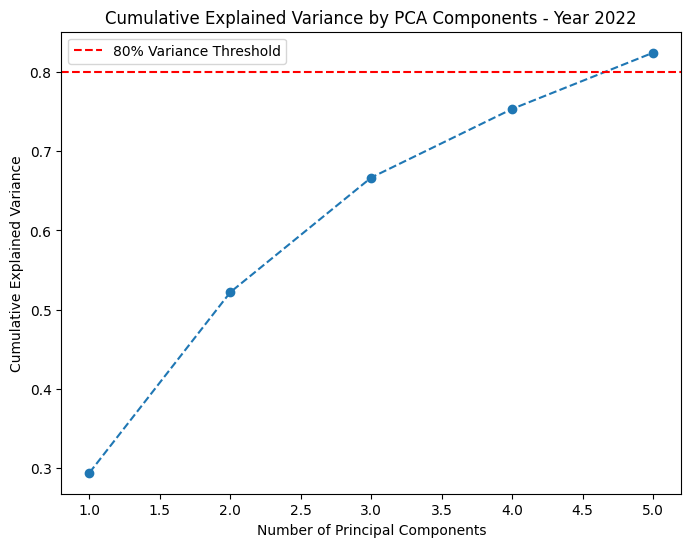

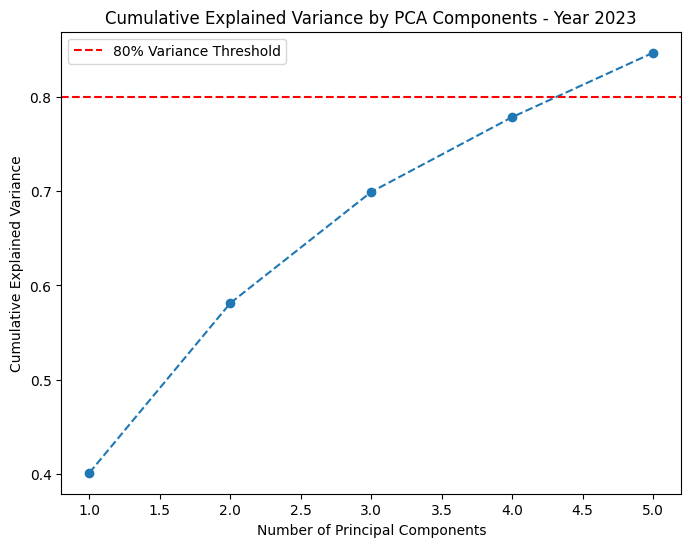

In [22]:
# Visualize explained variance for PCA
def plot_explained_variance(pca, year):
    """
    Plot the explained variance ratio for a PCA object.
    """
    plt.figure(figsize=(8, 6))
    plt.plot(range(1, len(pca.explained_variance_ratio_)+1), 
             np.cumsum(pca.explained_variance_ratio_), marker='o', linestyle='--')
    plt.title(f'Cumulative Explained Variance by PCA Components - {year}')
    plt.xlabel('Number of Principal Components')
    plt.ylabel('Cumulative Explained Variance')
    plt.axhline(y=variance_threshold, color='r', linestyle='--', label='80% Variance Threshold')
    plt.legend()
    plt.show()

# Plot explained variance for each year's PCA
plot_explained_variance(pca_2021, 'Year 2021')
plot_explained_variance(pca_2022, 'Year 2022')
plot_explained_variance(pca_2023, 'Year 2023')


## 6.3. Display PCA Datasets

### 6.3.1. Display PCA With Year 2021 

In [23]:
year_2021_pca

,PCA1,PCA2,PCA3,PCA4,PCA5,label
0,-0.289766,-1.348742,0.918359,0.930661,0.249272,0
1,-0.056828,-1.067866,-0.871672,1.236535,-1.098496,0
2,-1.152146,1.727346,0.639717,-0.503362,0.548920,0
3,-0.581447,-0.114186,0.284624,-1.317002,0.159528,0
4,-0.638147,0.517673,-1.418964,-0.360512,0.935312,0
...,...,...,...,...,...,...
12297,1.463827,0.294062,-0.277397,-0.786607,1.195524,1
12298,2.364380,-6.030668,0.989270,0.311599,0.118167,1
12299,2.982211,-3.631571,-0.606142,-1.642773,-0.581915,1
12300,4.011100,2.945173,-0.571538,0.492826,-1.008235,1


### 6.3.2. Display PCA With Year 2022

In [24]:
year_2022_pca

,PCA1,PCA2,PCA3,PCA4,PCA5,label
0,-2.109540,0.927242,-2.847147,1.645246,-0.122454,0
1,-2.836836,1.111596,-0.899916,1.392358,-1.336383,0
2,-0.338945,-0.083427,1.862565,0.303813,-0.324556,0
3,-2.408122,-1.292761,-0.226519,-0.682600,0.222351,0
4,-0.309995,1.566844,0.984105,-0.866798,0.497251,0
...,...,...,...,...,...,...
12297,1.830933,0.231180,-0.174040,-1.229465,1.419056,1
12298,0.439508,-3.198468,1.266626,-0.048984,-0.499559,1
12299,1.850203,-2.522873,1.253140,0.776359,-0.008819,1
12300,0.314520,-1.959337,0.213723,1.023808,0.389632,1


### 6.3.3. Display PCA With Year 2023

In [25]:
year_2023_pca

,PCA1,PCA2,PCA3,PCA4,PCA5,label
0,-1.316123,-0.998370,-3.029493,2.305293,0.515860,0
1,-2.076307,-0.802240,-1.032922,0.266427,1.165871,0
2,-0.785554,-0.017655,0.637546,0.720382,-1.207300,0
3,-1.832580,0.661885,-1.772908,-0.117505,1.100562,0
4,-2.454731,0.063634,-0.872573,1.026600,-1.537843,0
...,...,...,...,...,...,...
12297,3.912563,0.798687,-0.770443,-0.160398,-1.563141,1
12298,5.026900,0.696122,-1.906546,-1.331329,-0.253662,1
12299,3.814062,1.414185,-0.408215,0.073889,-0.109119,1
12300,2.118892,-2.537291,0.858027,1.261756,0.930742,1


## 6.4. Plotting Confusion Matrix For PCA Datasets

This code calculates and visualizes the correlation matrix for each PCA-transformed dataset (2021, 2022, and 2023) using a heatmap. The function plot_correlation_matrix computes the correlation matrix of the given dataset and displays it using the seaborn library's heatmap function, with annotations for the correlation values. This allows you to visually explore relationships between the principal components in each dataset.

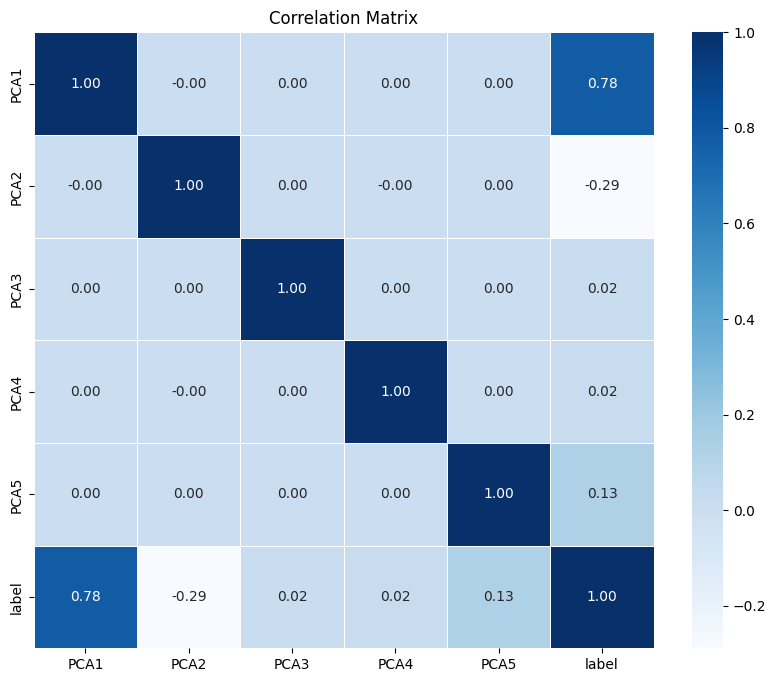

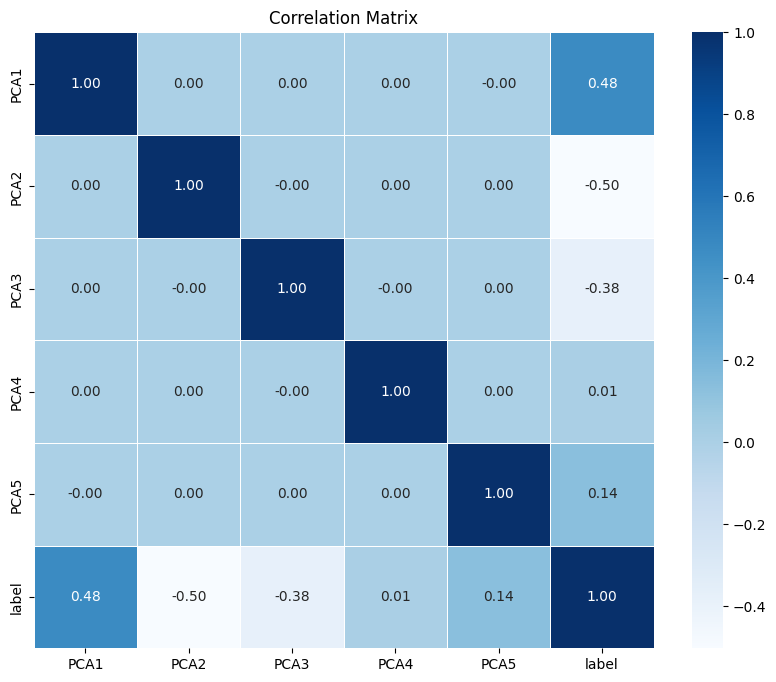

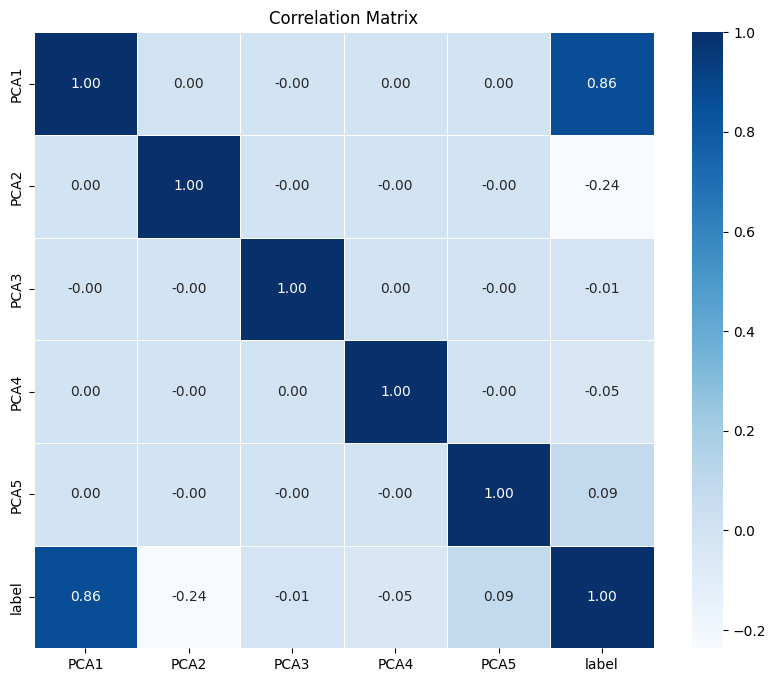

In [26]:
# Select the datasets for 2021, 2022, and 2023
datasets = [year_2021_pca, year_2022_pca, year_2023_pca]

# Function to plot correlation matrix
def plot_correlation_matrix(df, title="Correlation Matrix"):
    # Calculate the correlation matrix
    correlation_matrix = df.corr()

    # Create a heatmap to visualize the correlation matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='Blues', fmt='.2f', linewidths=0.5)
    plt.title(title)
    plt.show()

# Plot correlation matrices for each dataset
for dataset in datasets:
    plot_correlation_matrix(dataset)


## 6.5. Printing VIF Values For PCA Datasets

The code calculates and prints the Variance Inflation Factor (VIF) for each PCA-transformed dataset (2021, 2022, and 2023). The calculate_vif function computes VIF values for each feature, helping to identify multicollinearity. The print_vif function applies this calculation to all datasets and prints the results. VIF values greater than 10 indicate high multicollinearity between features.

In [27]:
# Function to calculate VIF values
def calculate_vif(df):
    # Add constant to the DataFrame (intercept for regression)
    X = add_constant(df)
    
    # Calculate VIF for each feature
    vif_data = pd.DataFrame()
    vif_data["Feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    
    return vif_data

# Assuming your datasets are stored in variables like cotton2021, cotton2022, etc.

datasets = [year_2021_pca, year_2022_pca, year_2023_pca]

# Function to print VIF values for each dataset
def print_vif(datasets):
    for df in datasets:
        print(f"VIF values for dataset:")
        # Select only numeric columns for VIF calculation
        numeric_df = df.select_dtypes(include=[np.number])
        vif_values = calculate_vif(numeric_df)
        print(vif_values)
        print("\n" + "="*50 + "\n")

# Print VIF values for each dataset
print_vif(datasets)

VIF values for dataset:
  Feature       VIF
0   const  2.052536
1    PCA1  3.106970
2    PCA2  1.288668
3    PCA3  1.000828
4    PCA4  1.001804
5    PCA5  1.057655
6   label  3.455924


VIF values for dataset:
  Feature       VIF
0   const  1.842185
1    PCA1  1.624372
2    PCA2  1.698588
3    PCA3  1.390274
4    PCA4  1.000106
5    PCA5  1.051912
6   label  2.765251


VIF values for dataset:
  Feature       VIF
0   const  2.582873
1    PCA1  4.854654
2    PCA2  1.291018
3    PCA3  1.001145
4    PCA4  1.011190
5    PCA5  1.039240
6   label  5.197247




## 6.6. Plotting VIF Graph For PCA Datasets 

This code calculates the Variance Inflation Factor (VIF) for each feature in the PCA-transformed datasets (2021, 2022, and 2023). The plot_vif function visualizes the VIF values using bar plots, helping to identify features with high multicollinearity. High VIF values suggest redundancy among features, which could affect model performance.








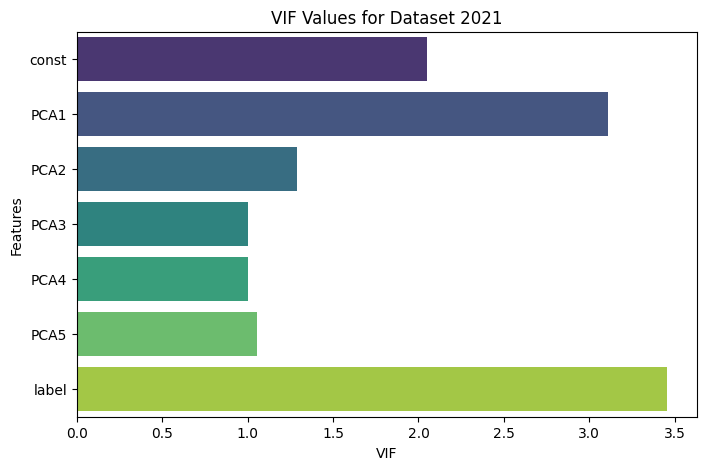

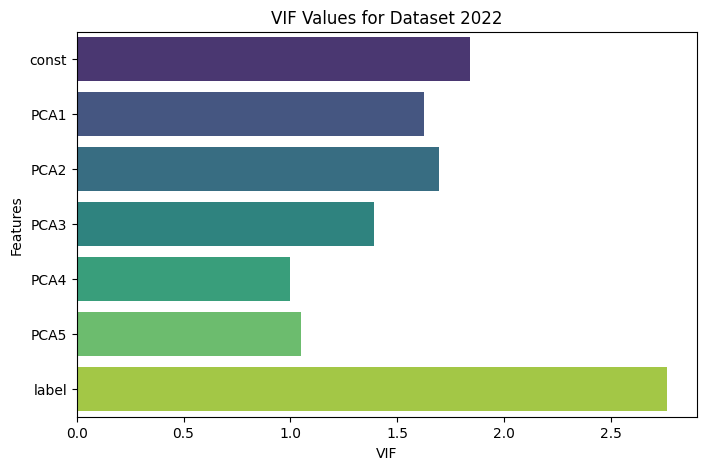

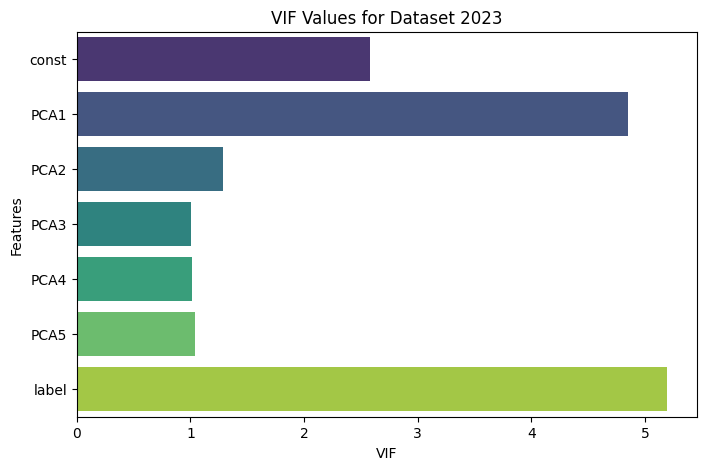

In [28]:
# Function to calculate VIF values
def calculate_vif(df):
    # Add constant to the DataFrame (intercept for regression)
    X = add_constant(df)
    
    # Calculate VIF for each feature
    vif_data = pd.DataFrame()
    vif_data["Feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    
    return vif_data

# Assuming your datasets are stored in variables like cotton2021, cotton2022, etc.

datasets = [year_2021_pca, year_2022_pca, year_2023_pca]

# Function to plot VIF values for each dataset
def plot_vif(datasets):
    for idx, df in enumerate(datasets):
        # Select only numeric columns for VIF calculation
        numeric_df = df.select_dtypes(include=[np.number])
        vif_values = calculate_vif(numeric_df)
        
        # Plot the VIF values
        plt.figure(figsize=(8, 5))
        sns.barplot(x='VIF', y='Feature', data=vif_values, palette='viridis')
        plt.title(f'VIF Values for Dataset {idx + 2021}')
        plt.xlabel('VIF')
        plt.ylabel('Features')
        plt.show()

# Plot VIF values for each dataset
plot_vif(datasets)


# 7. Display Frequency Of Classes

This code visualizes the distribution of the target variable (label for CropType) in three datasets (2021, 2022, and 2023) using count plots. It helps assess the balance between Cotton (label 0) and Rice (label 1) for each year, ensuring proper representation of both classes in the datasets.

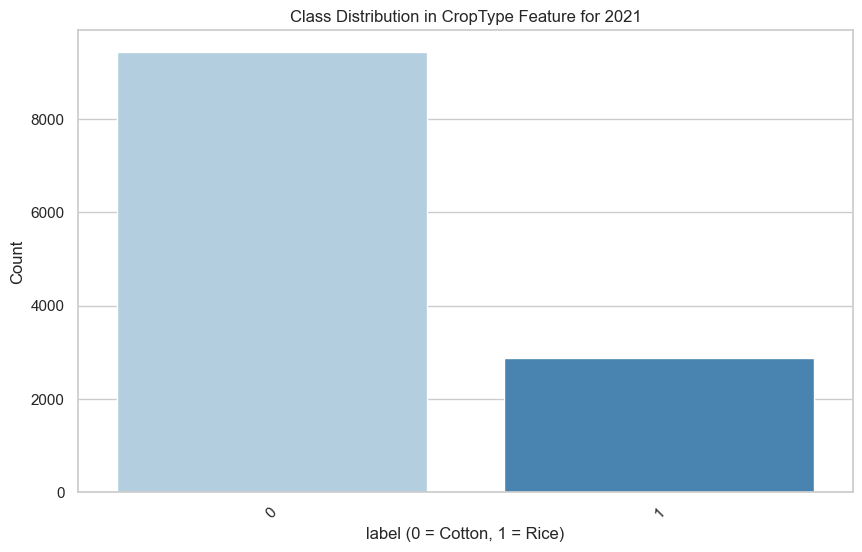

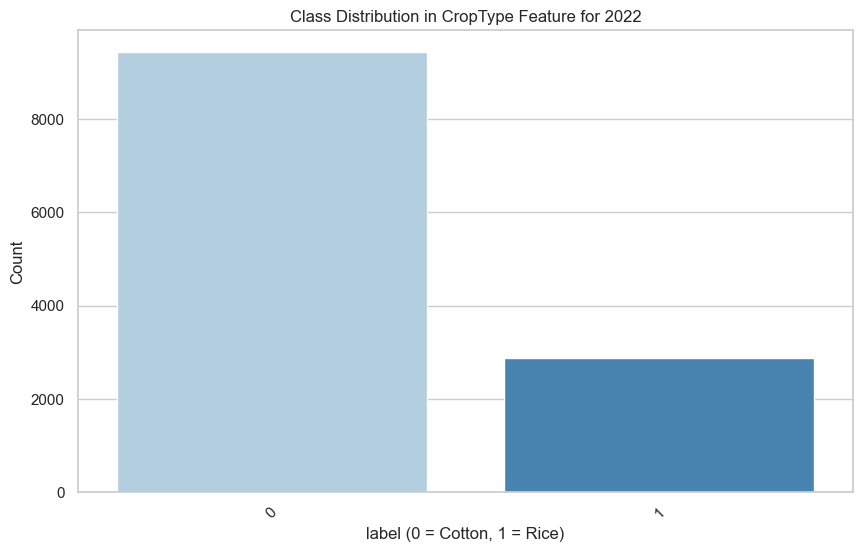

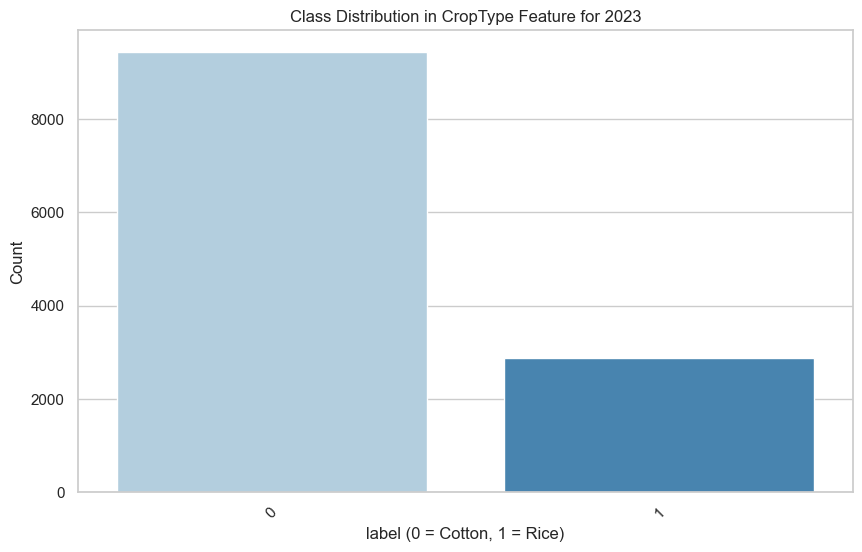

In [29]:
# Step 1: Set the style for the plot
sns.set(style="whitegrid")

# Plot the distribution of the target variable 'CropType' for each year
for year, data in zip([2021, 2022, 2023], [year_2021_pca, year_2022_pca, year_2023_pca]):
    plt.figure(figsize=(10, 6))
    sns.countplot(data=data, x='label', palette='Blues')
    plt.title(f'Class Distribution in CropType Feature for {year}')
    plt.xlabel('label (0 = Cotton, 1 = Rice)')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

# 8. Download Datasets

The code creates directories for storing preprocessed and PCA datasets, and saves each dataset as a CSV file in the corresponding subdirectory. It ensures that necessary directories exist before saving and prints a confirmation for each saved file.








In [79]:
# List of datasets
datasets = {
    "year_preprocessed": {
        "year2021preprocessed": year_2021_combined,
        "year2022preprocessed": year_2022_combined,
        "year2023preprocessed": year_2022_combined,
    },
    "year_pca": {
        "year2021pca": year_2021_pca,
        "year2022pca": year_2022_pca,
        "year2023pca": year_2023_pca,
    }
}

# Main directory
main_directory = "Preprocessed-Unsupervised_pca"

# Create main directory if it doesn't exist
if not os.path.exists(main_directory):
    os.makedirs(main_directory)

# Save files in organized subdirectories
for category, files in datasets.items():
    category_dir = os.path.join(main_directory, category)  # e.g., Preprocessed-Unsupervised/cotton
    if not os.path.exists(category_dir):
        os.makedirs(category_dir)  # Create subdirectories 'cotton' and 'rice'

    for name, df in files.items():
        file_path = os.path.join(category_dir, f"{name}.csv")  # File path for each CSV
        df.to_csv(file_path, index=False)  # Save DataFrame as CSV
        print(f"Saved {name}.csv in {category_dir}")

Saved year2021preprocessed.csv in Preprocessed-Unsupervised_pca\year_preprocessed
Saved year2022preprocessed.csv in Preprocessed-Unsupervised_pca\year_preprocessed
Saved year2023preprocessed.csv in Preprocessed-Unsupervised_pca\year_preprocessed
Saved year2021pca.csv in Preprocessed-Unsupervised_pca\year_pca
Saved year2022pca.csv in Preprocessed-Unsupervised_pca\year_pca
Saved year2023pca.csv in Preprocessed-Unsupervised_pca\year_pca


# 9. Unsupervised Model Implementation

The functions calculate clustering purity, visualize clusters using PCA, and plot confusion matrices and silhouette scores. They help evaluate clustering performance by comparing predicted clusters with true labels, displaying data in 2D, and measuring cluster cohesion.








In [31]:
# Function to compute cluster purity
def calculate_cluster_purity(y_true, y_pred):
    """
    Calculate cluster purity.
    """
    contingency_matrix = confusion_matrix(y_true, y_pred)
    return np.sum(np.amax(contingency_matrix, axis=0)) / np.sum(contingency_matrix)

# Function to visualize using PCA
def visualize_with_pca(X, y_true, y_pred, title="PCA Visualization of Clusters"):
    """
    Visualize clusters using PCA-reduced data.
    """
    # Apply PCA to reduce the data to 2 components for visualization
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)

    # Create a DataFrame for visualization
    X_pca_df = pd.DataFrame(X_pca, columns=['PCA1', 'PCA2'])
    X_pca_df['Predicted_Cluster'] = y_pred
    X_pca_df['True_Label'] = y_true

    plt.figure(figsize=(14, 6))

    # Plot predicted clusters
    plt.subplot(1, 2, 1)
    sns.scatterplot(data=X_pca_df, x='PCA1', y='PCA2', hue='Predicted_Cluster', palette='viridis', alpha=0.7)
    plt.title(f"{title} - Predicted Clusters")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.legend(title="Predicted Cluster", loc='best')

    # Plot true labels
    plt.subplot(1, 2, 2)
    sns.scatterplot(data=X_pca_df, x='PCA1', y='PCA2', hue='True_Label', palette='coolwarm', alpha=0.7)
    plt.title(f"{title} - True Labels")
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.legend(title="True Label", loc='best')

    plt.tight_layout()
    plt.show()

# Function to plot the confusion matrix
def plot_confusion_matrix(conf_matrix, title="Confusion Matrix"):
    """
    Plot a confusion matrix using seaborn heatmap.
    """
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues', cbar=False)
    plt.title(title)
    plt.xlabel("Predicted Cluster")
    plt.ylabel("True Cluster")
    plt.show()

# Function to plot silhouette scores
def plot_silhouette_scores(X, y_pred, title="Silhouette Score Visualization"):
    """
    Plot silhouette scores for the clustering.
    """
    silhouette_avg = silhouette_score(X, y_pred)
    print(f"Average Silhouette Score: {silhouette_avg:.4f}")

    plt.figure(figsize=(10, 6))
    sample_silhouette_values = silhouette_samples(X, y_pred)
    
    sns.histplot(sample_silhouette_values, bins=20, kde=True, color='skyblue')
    plt.title(f"{title} - Average Score: {silhouette_avg:.4f}")
    plt.xlabel("Silhouette Score")
    plt.ylabel("Frequency")
    plt.axvline(x=silhouette_avg, color='red', linestyle='--')
    plt.show()

# 10. K-Means Clustering

## 10.1 Simple Clustering

This function performs KMeans clustering on PCA-transformed data, evaluates the clustering results using cluster purity, and visualizes the clusters using PCA plots, confusion matrices, and silhouette scores. It applies the clustering process to data for each year, calculates the cluster purity, and outputs the evaluation metrics for each year.

Clustering for Year 2021:


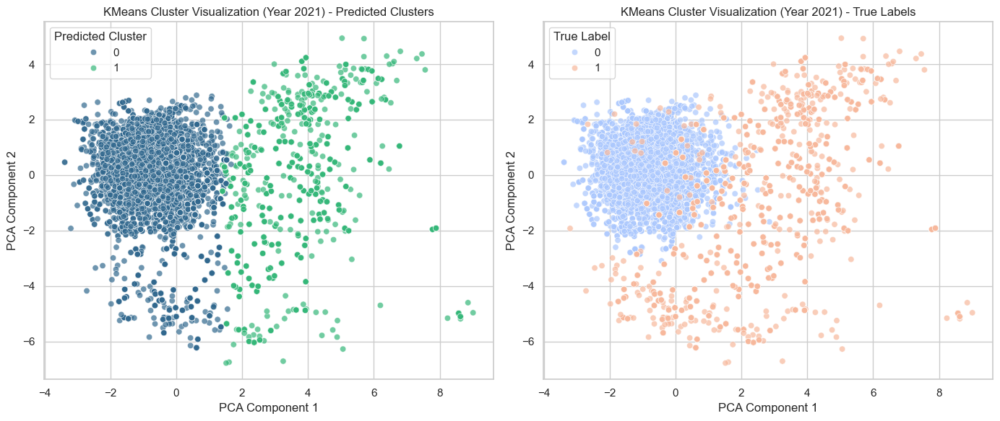

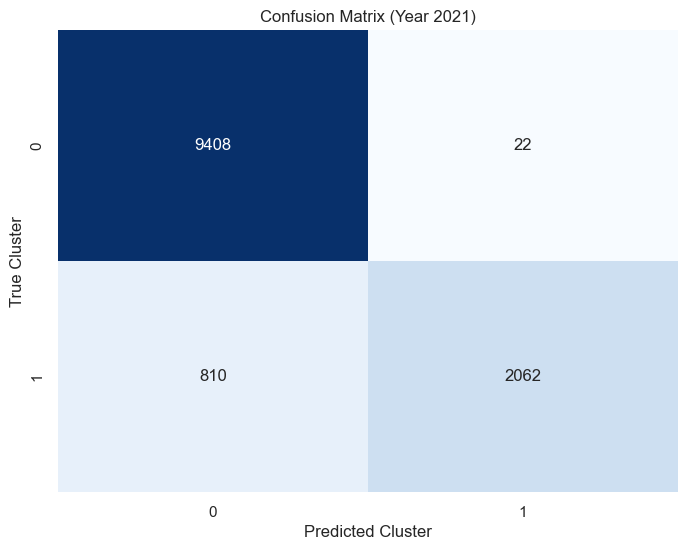

Average Silhouette Score: 0.4350


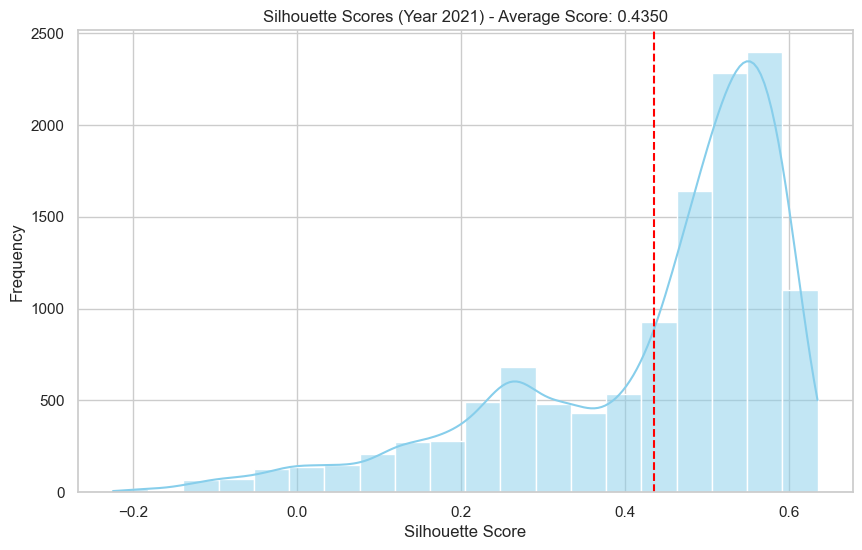

Cluster Purity for Year 2021: 0.9324
--------------------------------------------------
Clustering for Year 2022:


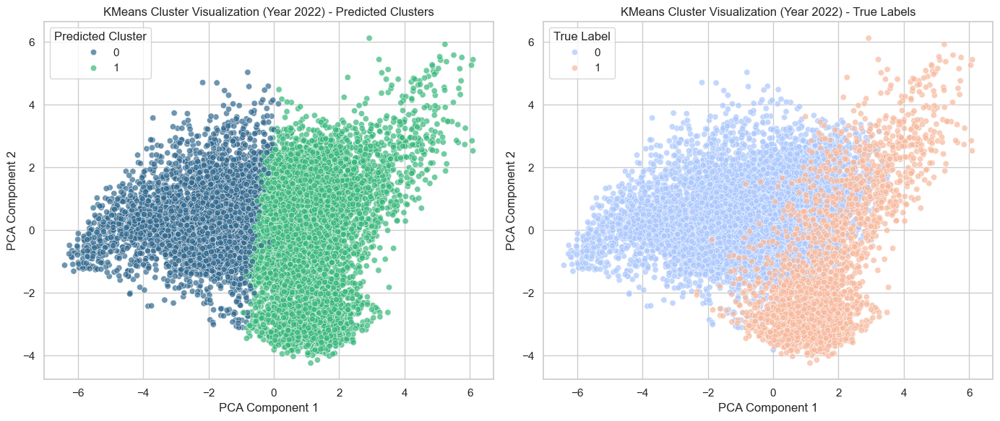

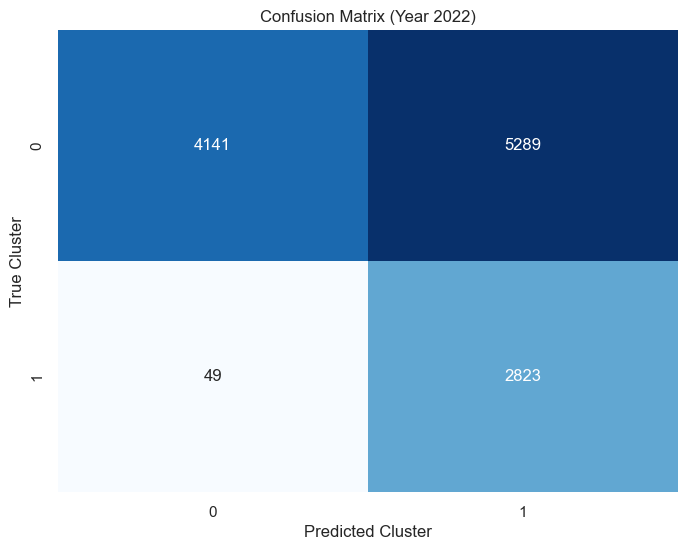

Average Silhouette Score: 0.2190


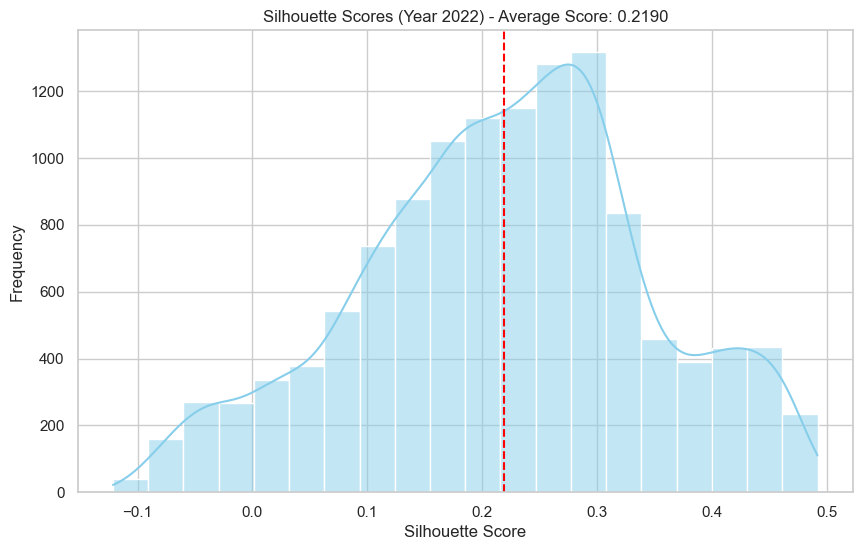

Cluster Purity for Year 2022: 0.7665
--------------------------------------------------
Clustering for Year 2023:


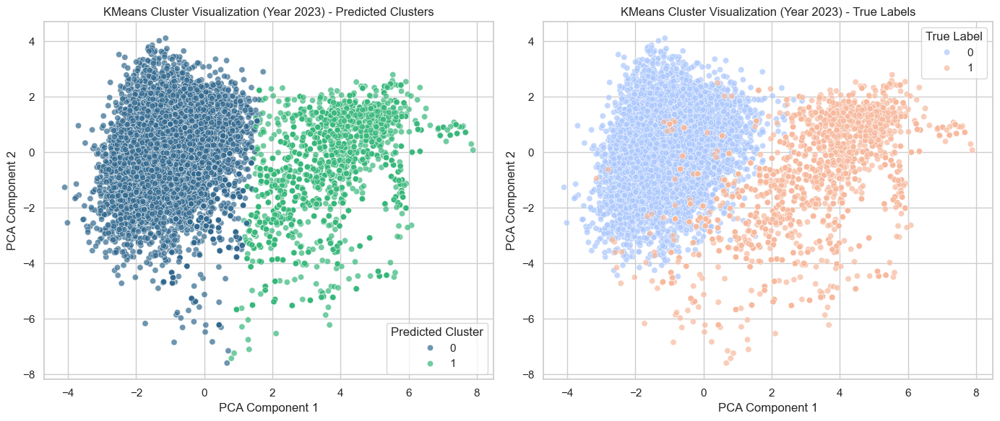

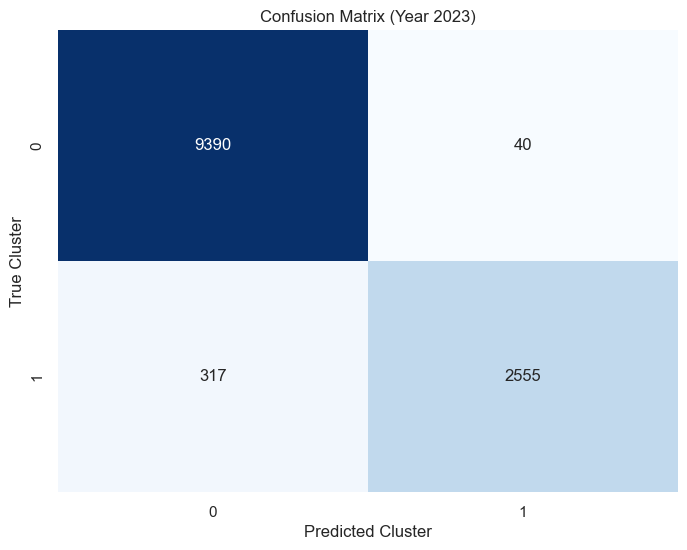

Average Silhouette Score: 0.4482


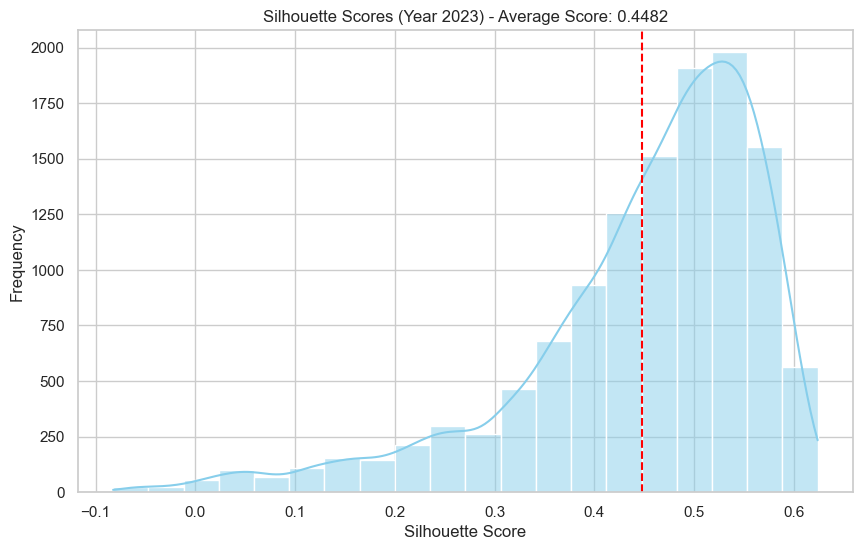

Cluster Purity for Year 2023: 0.9710
--------------------------------------------------


In [32]:
# Main clustering function
def perform_clustering(data, n_clusters=2, year="Year"):
    """
    Perform KMeans clustering, evaluate using cluster purity, and visualize clusters.
    """
    # Split features and labels
    X = data.drop(columns=['label'])
    y_true = data['label']

    # Fit KMeans
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    y_pred = kmeans.fit_predict(X)

    # Calculate cluster purity
    contingency_matrix = confusion_matrix(y_true, y_pred)
    purity = calculate_cluster_purity(y_true, y_pred)

    # Visualize combined clusters and true labels using PCA
    visualize_with_pca(X, y_true, y_pred, title=f"KMeans Cluster Visualization ({year})")

    # Visualize the confusion matrix with a heatmap
    plot_confusion_matrix(contingency_matrix, title=f"Confusion Matrix ({year})")
    
    # Plot silhouette scores
    plot_silhouette_scores(X, y_pred, title=f"Silhouette Scores ({year})")

    return purity, contingency_matrix

# Dictionary of PCA-transformed data for clustering
years_data = {
    '2021': year_2021_pca,
    '2022': year_2022_pca,
    '2023': year_2023_pca
}

# Number of clusters (adjust based on domain knowledge or prior analysis)
n_clusters = 2

# Perform clustering on each year's PCA-transformed data
for year, data in years_data.items():
    print(f"Clustering for Year {year}:")
    purity, conf_matrix = perform_clustering(data, n_clusters=n_clusters, year=f"Year {year}")
    print(f"Cluster Purity for Year {year}: {purity:.4f}")
    print("-" * 50)


## 10.2 Grid Search Clustering

In [91]:
!pip install kneed

The code performs KMeans clustering for each year’s PCA-transformed data, determining the optimal number of clusters using the elbow method. It evaluates clustering quality with cluster purity, silhouette scores, and visualizations of the clusters using PCA and confusion matrices.

Clustering for Year 2021:


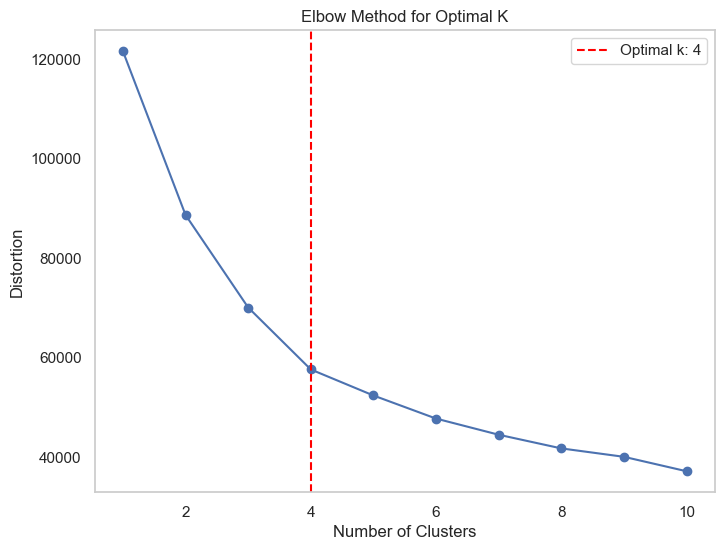

Optimal number of clusters for Year 2021: 4


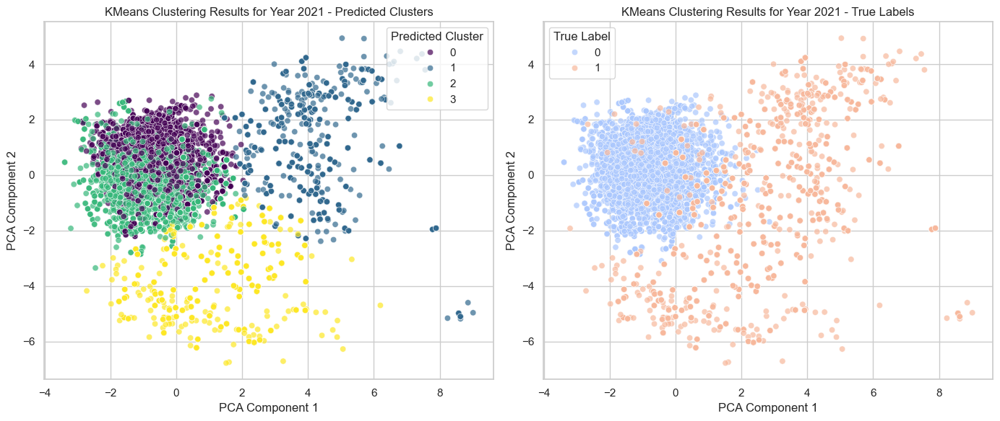

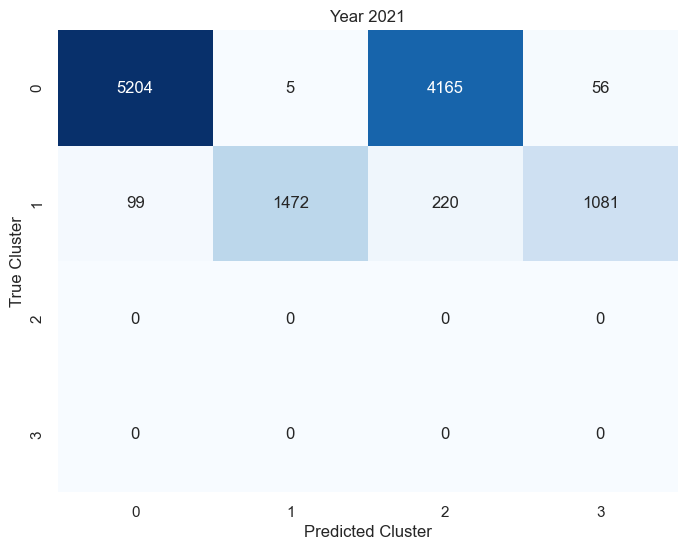

Average Silhouette Score: 0.2481


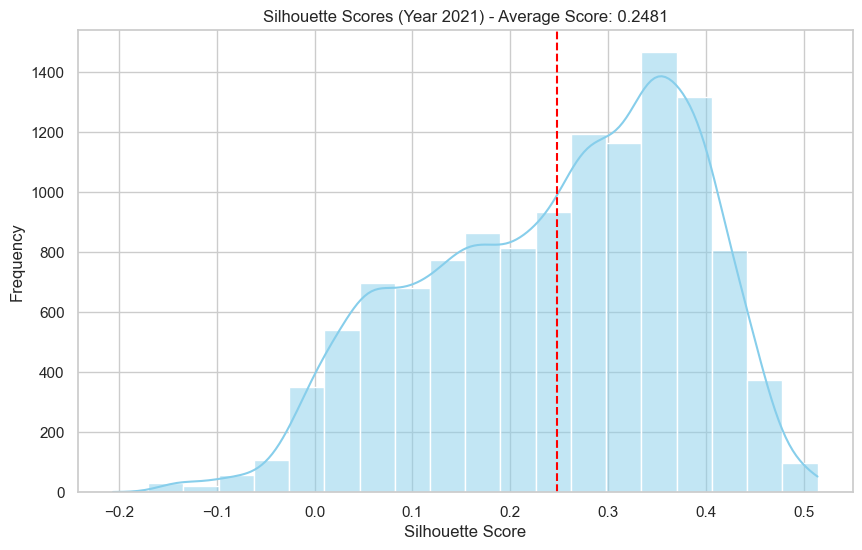

Cluster Purity for Year 2021: 0.9691
Optimal k for Year 2021: 4
--------------------------------------------------
Clustering for Year 2022:


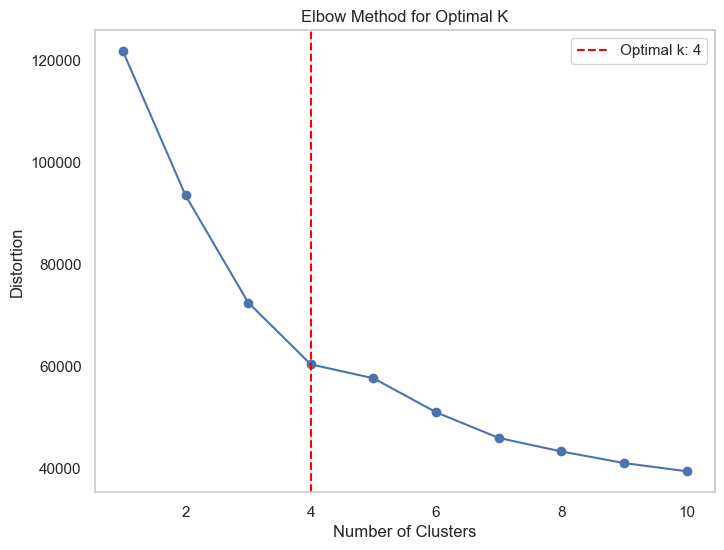

Optimal number of clusters for Year 2022: 4


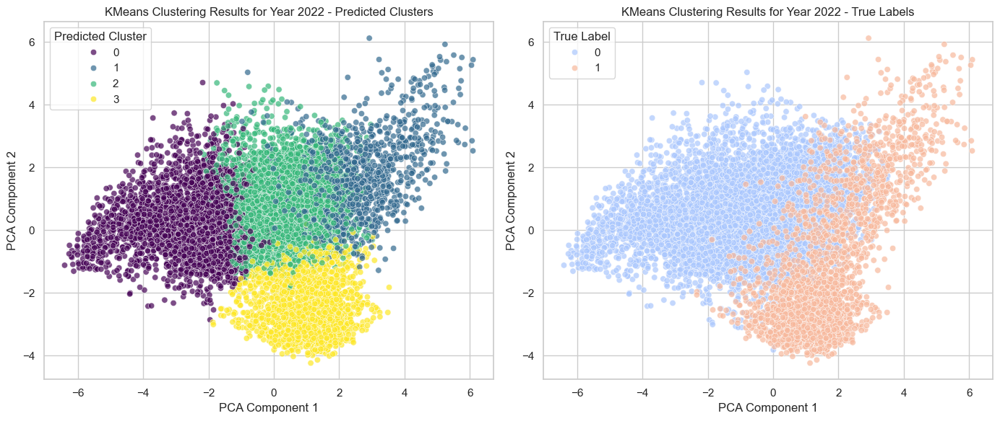

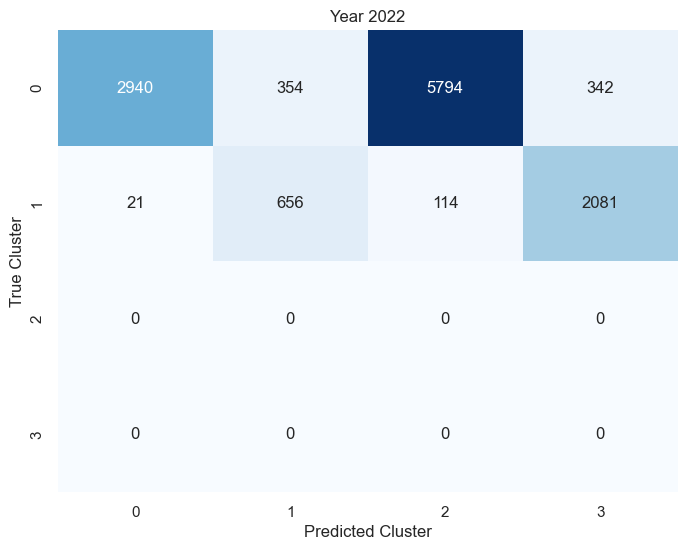

Average Silhouette Score: 0.2774


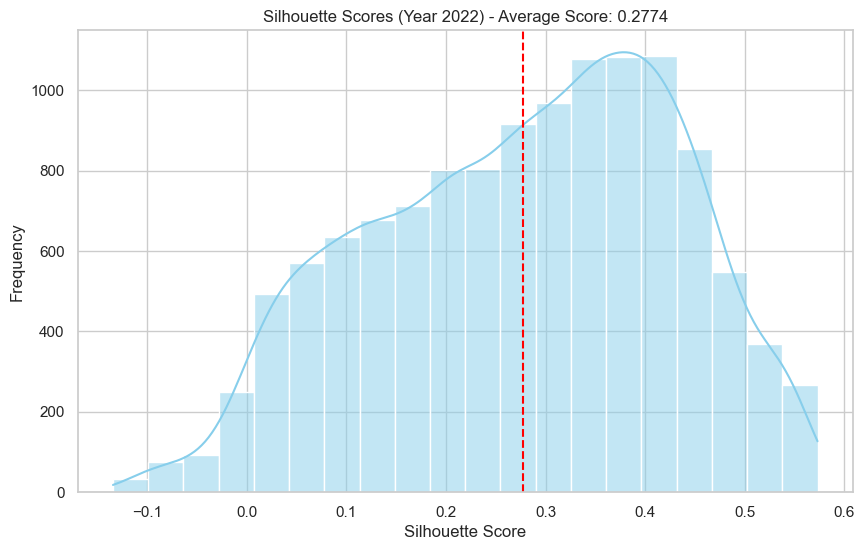

Cluster Purity for Year 2022: 0.9325
Optimal k for Year 2022: 4
--------------------------------------------------
Clustering for Year 2023:


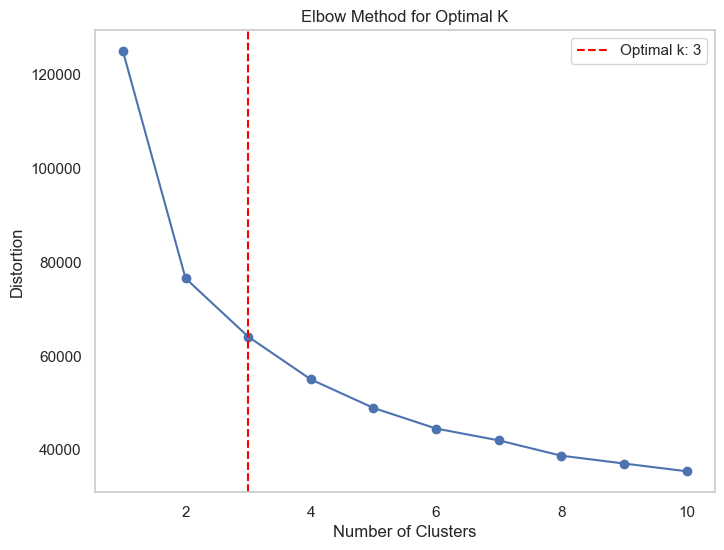

Optimal number of clusters for Year 2023: 3


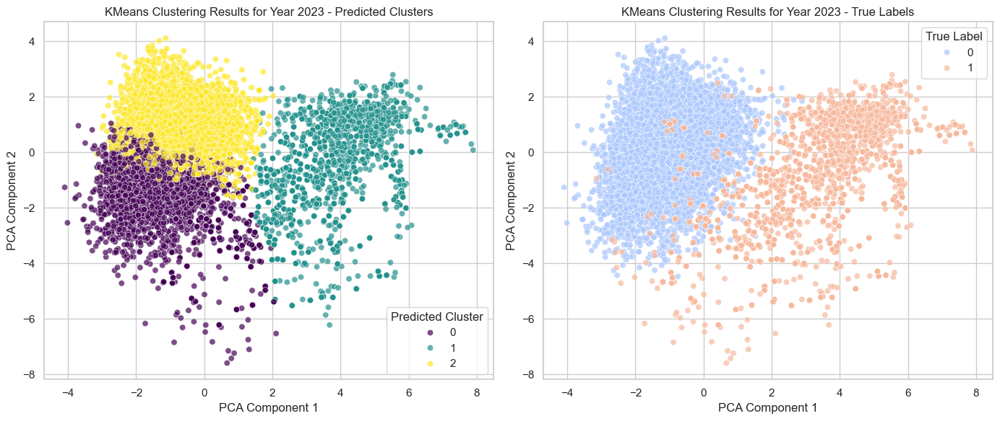

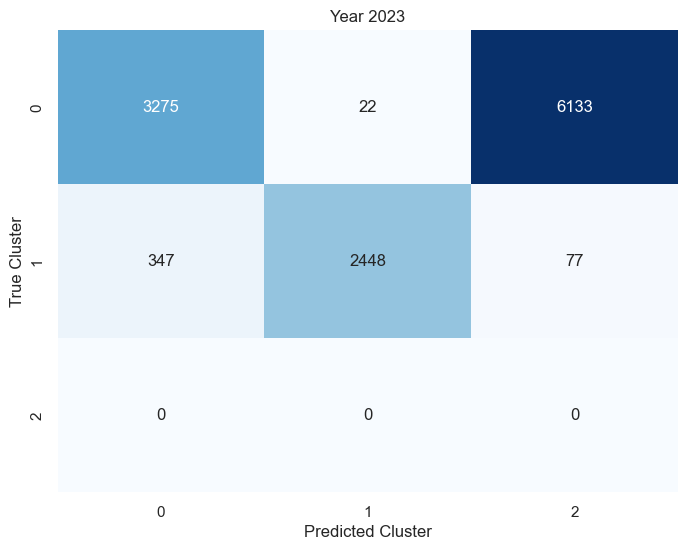

Average Silhouette Score: 0.2467


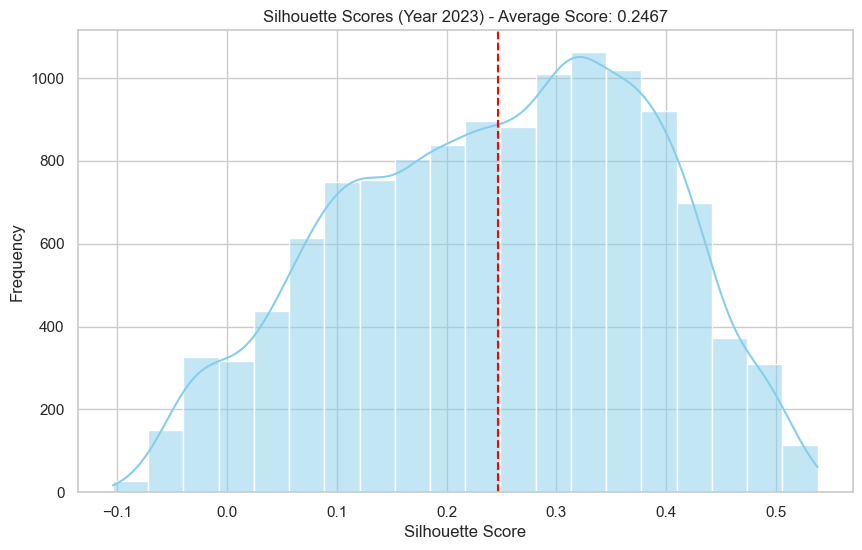

Cluster Purity for Year 2023: 0.9637
Optimal k for Year 2023: 3
--------------------------------------------------


In [34]:
# Function to determine the best number of clusters using the elbow method
def determine_best_k(X):
    """
    Use the elbow method to determine the optimal number of clusters.
    """
    distortions = []
    k_values = range(1, 11)  # Testing cluster sizes from 1 to 10
    for k in k_values:
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(X)
        distortions.append(kmeans.inertia_)

    # Use the knee locator to find the optimal k (elbow point)
    kneedle = KneeLocator(k_values, distortions, curve="convex", direction="decreasing")
    best_k = kneedle.knee

    # Plot the elbow graph
    plt.figure(figsize=(8, 6))
    plt.plot(k_values, distortions, marker='o')
    plt.axvline(best_k, color='red', linestyle='--', label=f"Optimal k: {best_k}")
    plt.title("Elbow Method for Optimal K")
    plt.xlabel("Number of Clusters")
    plt.ylabel("Distortion")
    plt.legend()
    plt.grid()
    plt.show()

    return best_k


# Main clustering function
def perform_clustering(data, year):
    """
    Perform KMeans clustering on the dataset for a specific year.
    """
    X = data.drop(columns=['label'])  # Features (already PCA-transformed)
    y = data['label']  # True labels

    # Determine the best number of clusters using the elbow method
    best_k = determine_best_k(X)
    print(f"Optimal number of clusters for {year}: {best_k}")

    # Fit KMeans with the best k
    kmeans = KMeans(n_clusters=best_k, random_state=42)
    y_pred = kmeans.fit_predict(X)

    # Calculate cluster purity
    purity = calculate_cluster_purity(y, y_pred)

    # Visualize clusters and true labels using PCA (already reduced)
    visualize_with_pca(X, y, y_pred, title=f"KMeans Clustering Results for {year}")

    # Confusion matrix
    conf_matrix = confusion_matrix(y, y_pred)
    plot_confusion_matrix(conf_matrix, year)
    
    # Plot silhouette scores
    plot_silhouette_scores(X, y_pred, title=f"Silhouette Scores ({year})")

    return purity, best_k


# Dictionary of PCA-transformed data for clustering
datasets = {
    "Year 2021": year_2021_pca,
    "Year 2022": year_2022_pca,
    "Year 2023": year_2023_pca,
}

# Perform clustering for each year's PCA-transformed data
for year, data in datasets.items():
    print(f"Clustering for {year}:")
    purity, best_k = perform_clustering(data, year)
    print(f"Cluster Purity for {year}: {purity:.4f}")
    print(f"Optimal k for {year}: {best_k}")
    print("-" * 50)


# 11. Hierarchical Clustering

## 11.1. Simple Clustering

The code performs Agglomerative Clustering on PCA-transformed data for each year. It evaluates clustering performance using cluster purity, confusion matrices, and silhouette scores, while also visualizing the clusters and true labels in 2D PCA space. The number of clusters is set to 2 by default, but can be adjusted as needed.

Clustering for Year 2021:


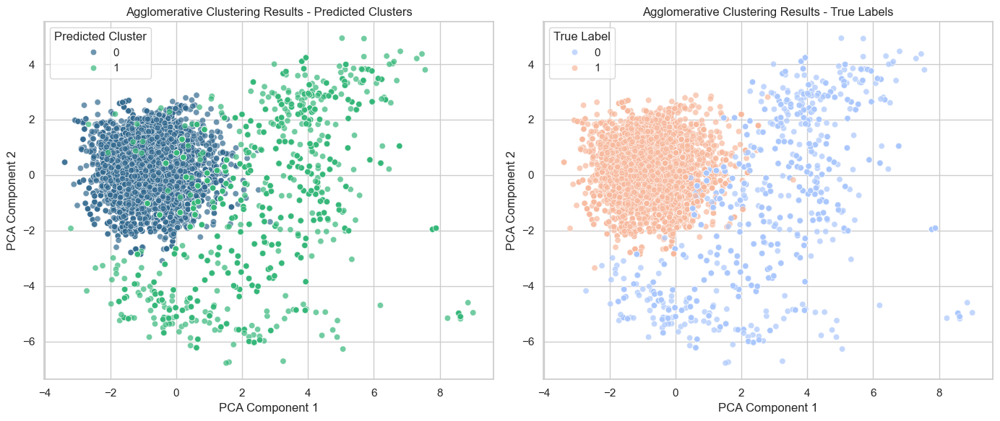

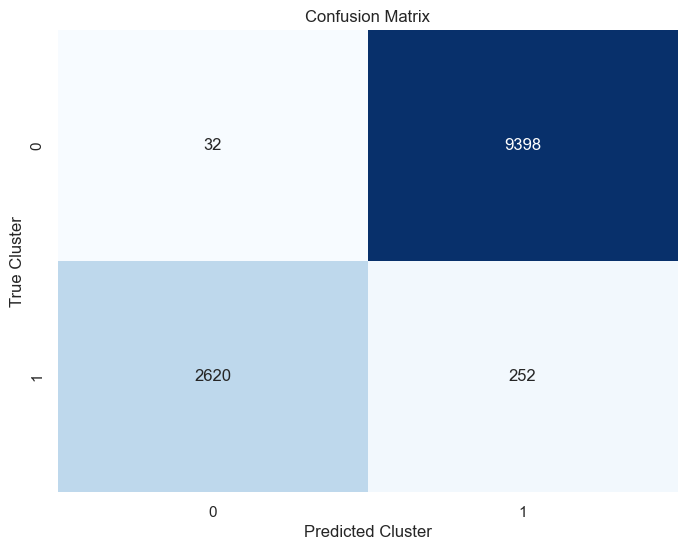

Average Silhouette Score: 0.4172


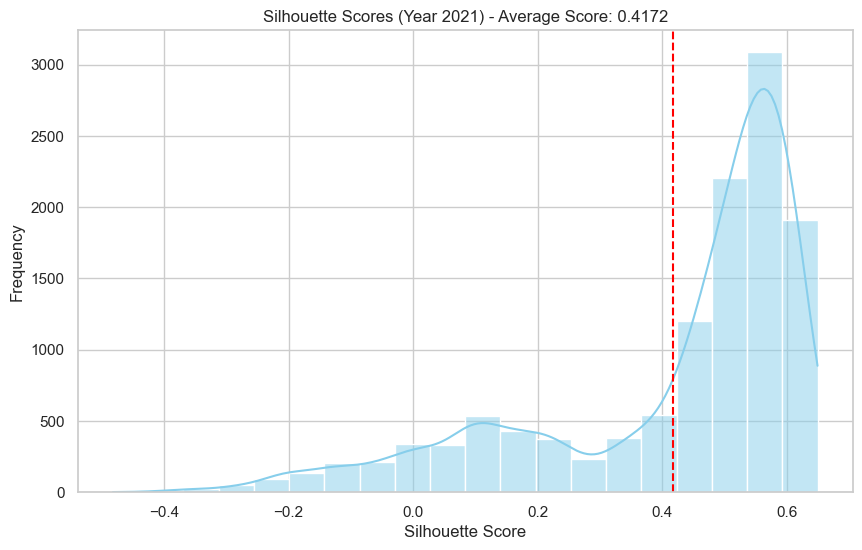

Cluster Purity for Year 2021: 0.9769
--------------------------------------------------
Clustering for Year 2022:


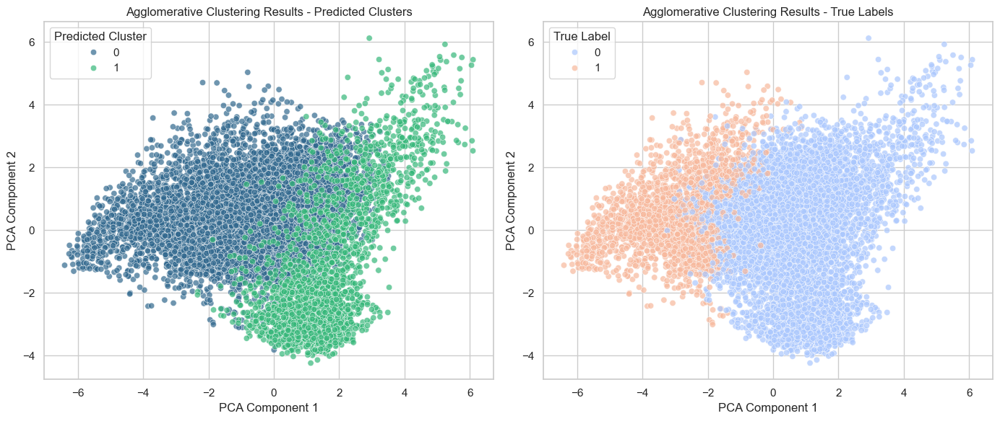

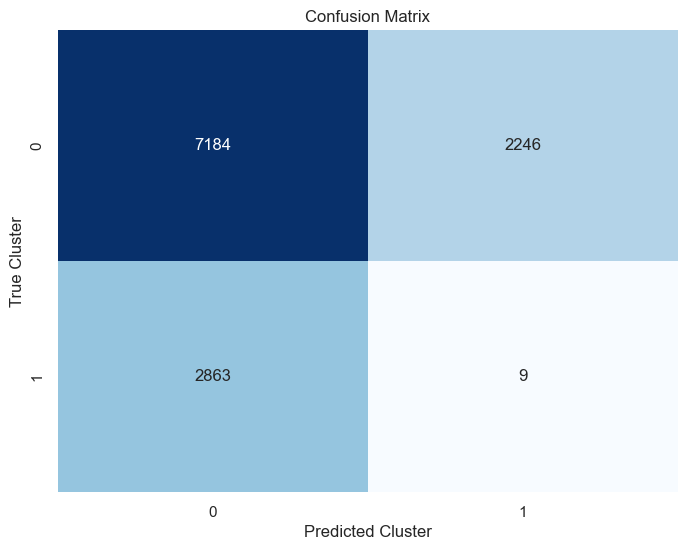

Average Silhouette Score: 0.2421


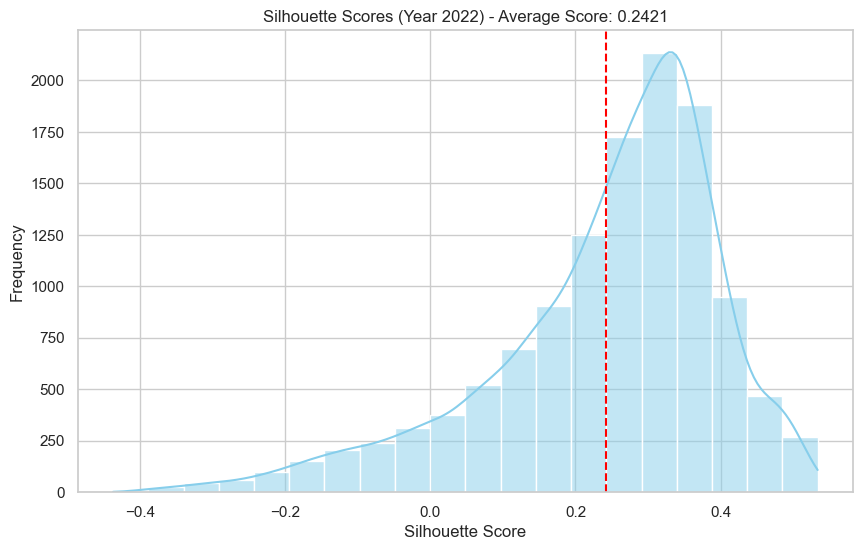

Cluster Purity for Year 2022: 0.7665
--------------------------------------------------
Clustering for Year 2023:


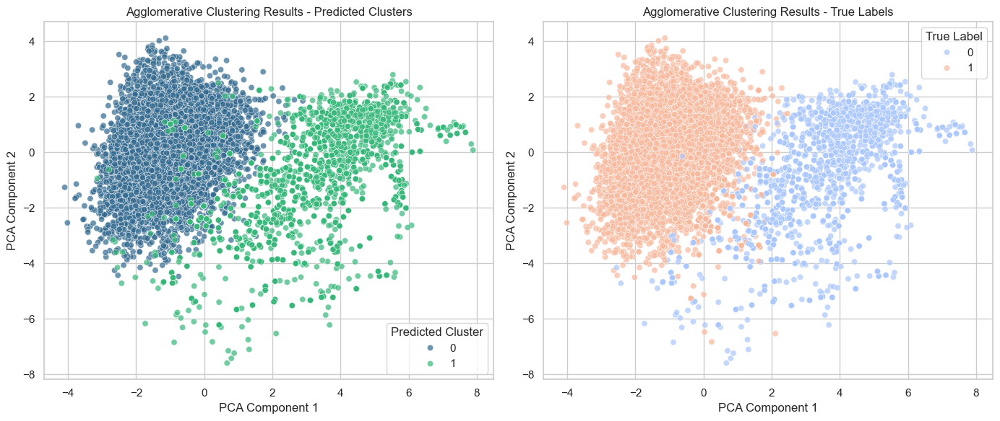

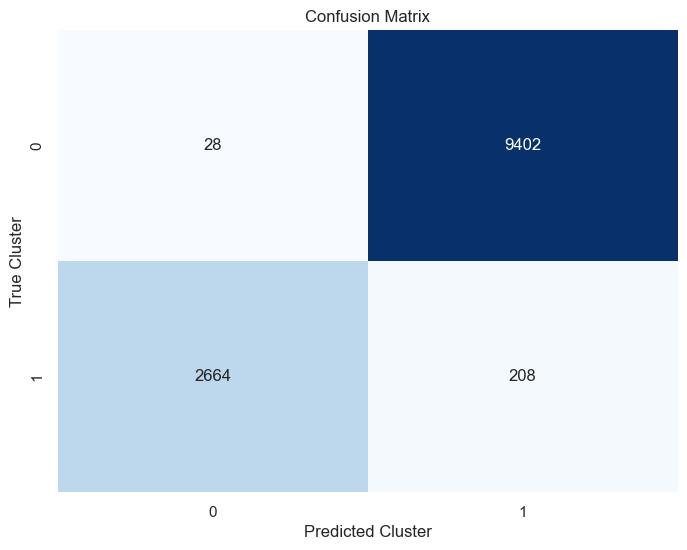

Average Silhouette Score: 0.4415


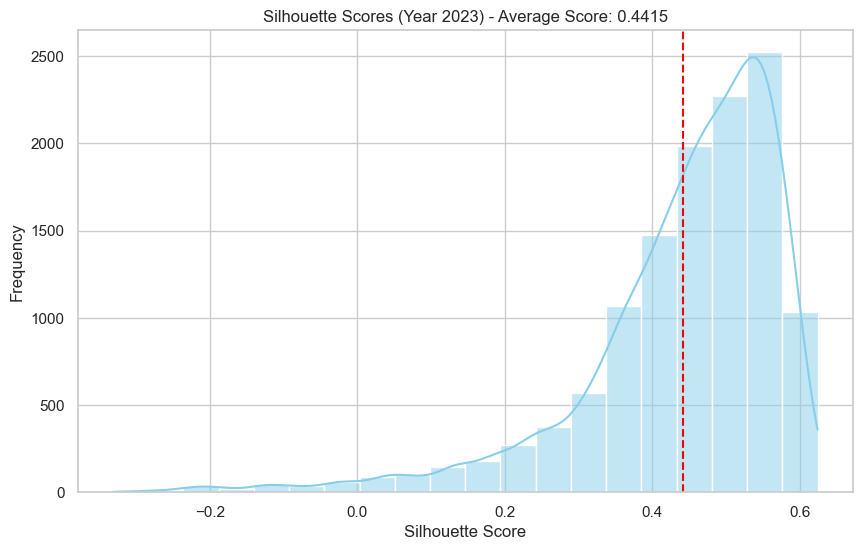

Cluster Purity for Year 2023: 0.9808
--------------------------------------------------


In [35]:
# Function to perform hierarchical clustering on a single dataset
def perform_clustering(data, n_clusters=2):
    """
    Perform AgglomerativeClustering on the dataset and evaluate.
    """
    X = data.drop(columns=['label'])  # Features (already PCA-transformed)
    y = data['label']  # True labels

    # Apply AgglomerativeClustering
    agglomerative = AgglomerativeClustering(n_clusters=n_clusters)
    y_pred = agglomerative.fit_predict(X)

    # Calculate cluster purity
    contingency_matrix = confusion_matrix(y, y_pred)
    purity = calculate_cluster_purity(y, y_pred)

    # Visualize clusters using PCA (no need for PCA again since data is already PCA-transformed)
    visualize_with_pca(X, y_pred, y, title="Agglomerative Clustering Results")

    # Plot confusion matrix
    plot_confusion_matrix(contingency_matrix)
    
    # Plot silhouette scores
    plot_silhouette_scores(X, y_pred, title=f"Silhouette Scores ({year})")

    return purity, contingency_matrix


# Cluster analysis for each year using PCA-transformed data
datasets = {
    "Year 2021": year_2021_pca,  # Using PCA-transformed data
    "Year 2022": year_2022_pca,  # Using PCA-transformed data
    "Year 2023": year_2023_pca,  # Using PCA-transformed data
}

n_clusters = 2  # Replace with your desired number of clusters (adjust as needed)

for year, data in datasets.items():
    print(f"Clustering for {year}:")
    purity, conf_matrix = perform_clustering(data, n_clusters=n_clusters)
    print(f"Cluster Purity for {year}: {purity:.4f}")
    print("-" * 50)


## 11.2. Grid Search Clustering

This code performs Agglomerative Clustering using hierarchical methods and visualizes the results, including dendrograms, cluster purity, and silhouette scores. The optimal number of clusters is determined based on the silhouette score and the dendrogram. For each year’s PCA-transformed dataset, the algorithm fits the clustering model, calculates purity, and visualizes clusters with PCA, confusion matrices, and silhouette scores.

Clustering for Year 2021:


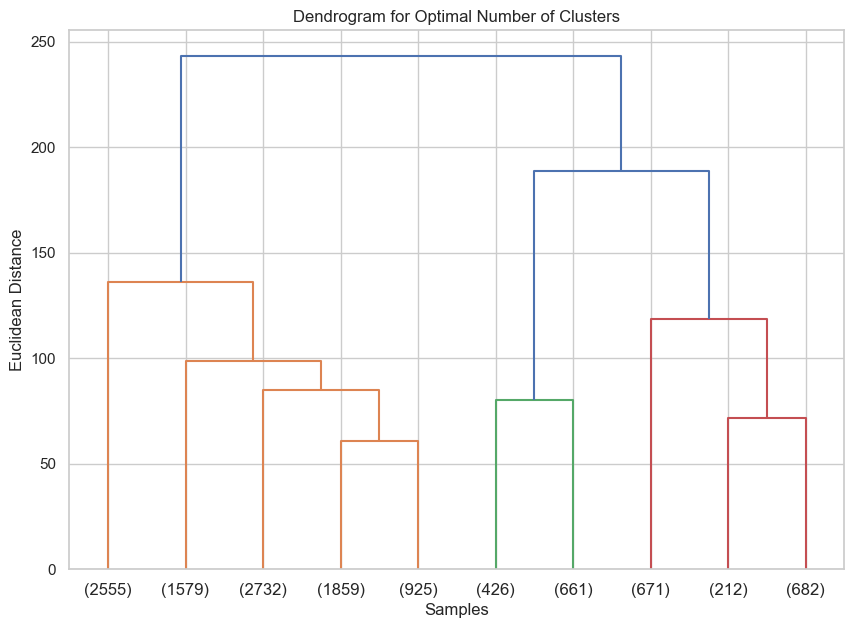

Automatically selected number of clusters: 3 with Silhouette Score: 0.4311


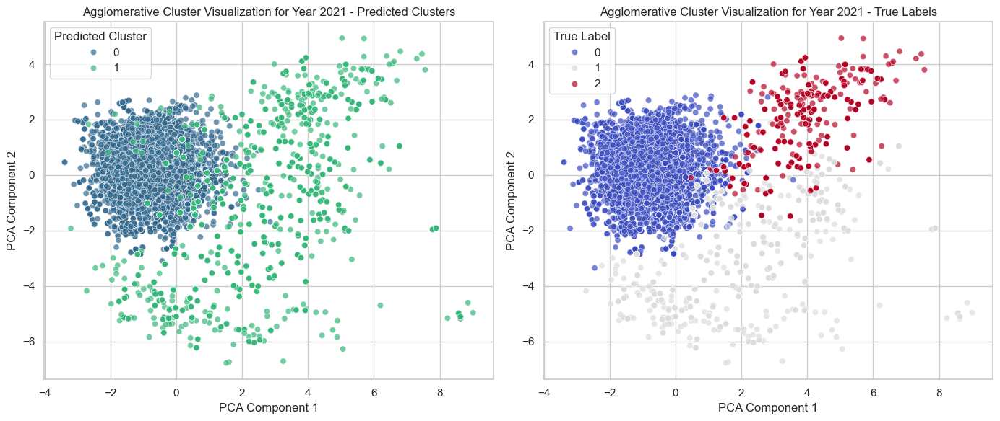

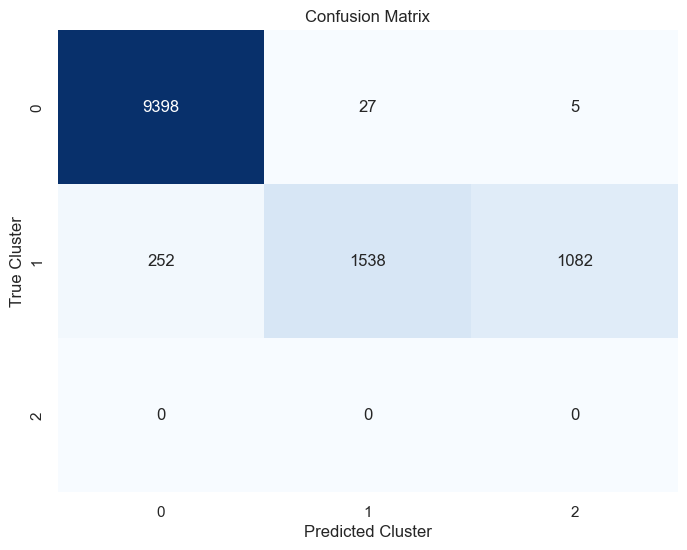

Average Silhouette Score: 0.4311


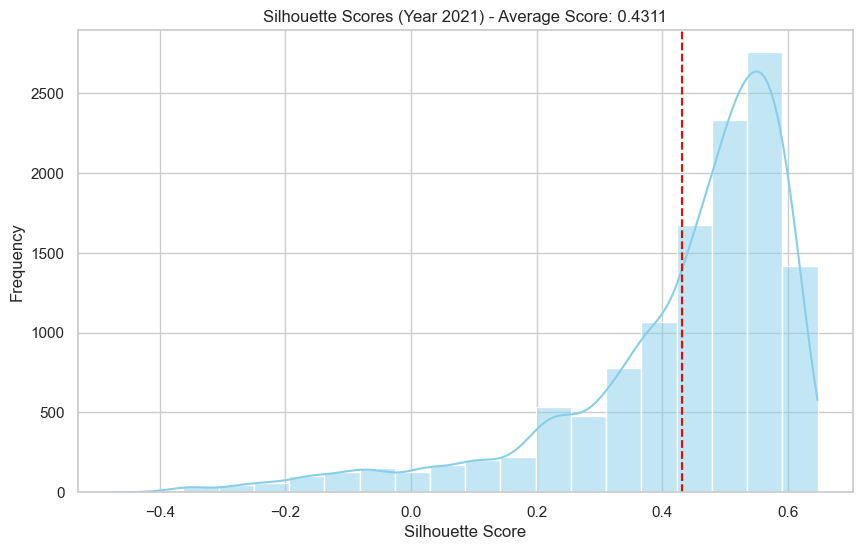

Cluster Purity for Year 2021: 0.9769
--------------------------------------------------
Clustering for Year 2022:


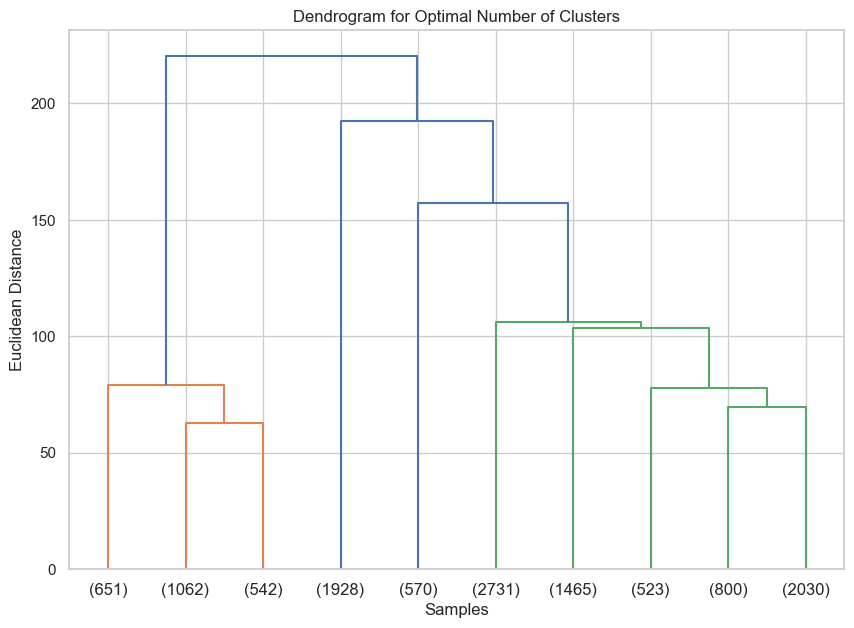

Automatically selected number of clusters: 4 with Silhouette Score: 0.2518


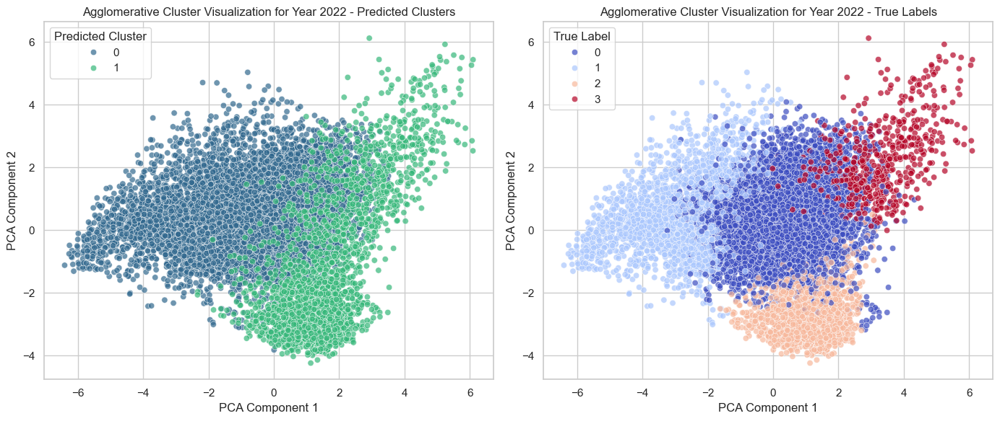

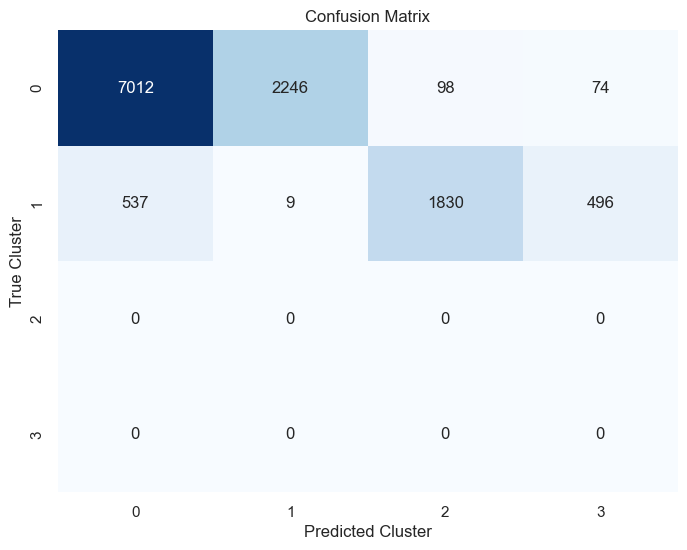

Average Silhouette Score: 0.2518


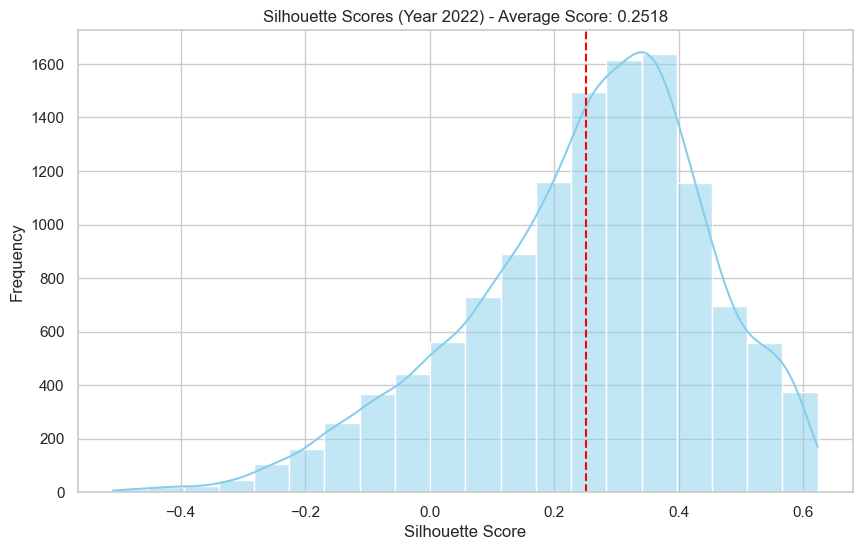

Cluster Purity for Year 2022: 0.9416
--------------------------------------------------
Clustering for Year 2023:


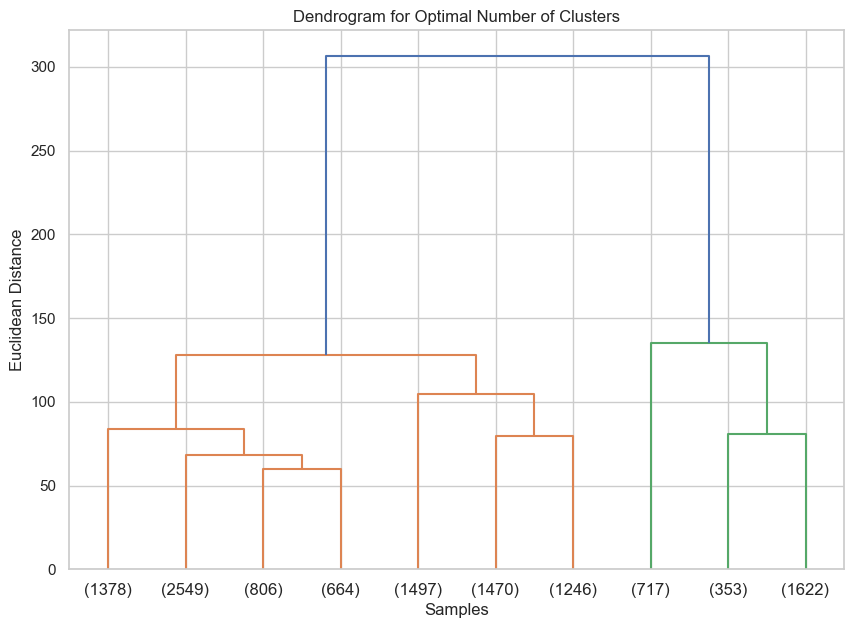

Automatically selected number of clusters: 2 with Silhouette Score: 0.4415


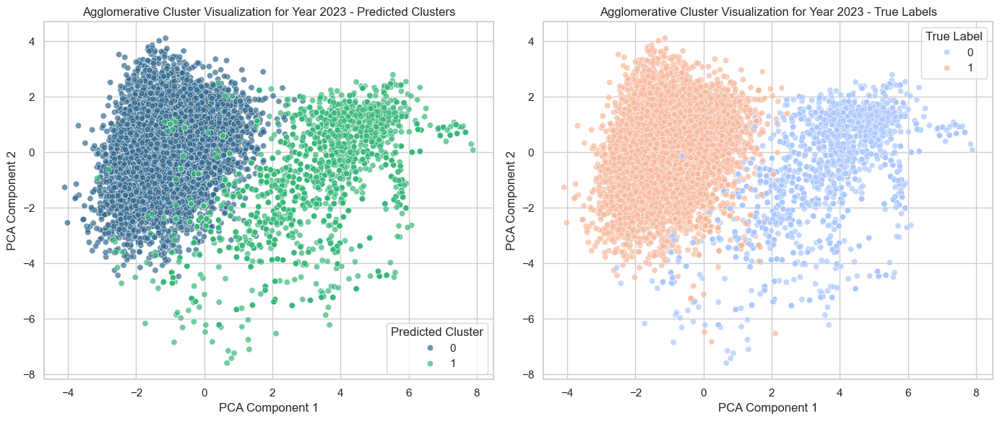

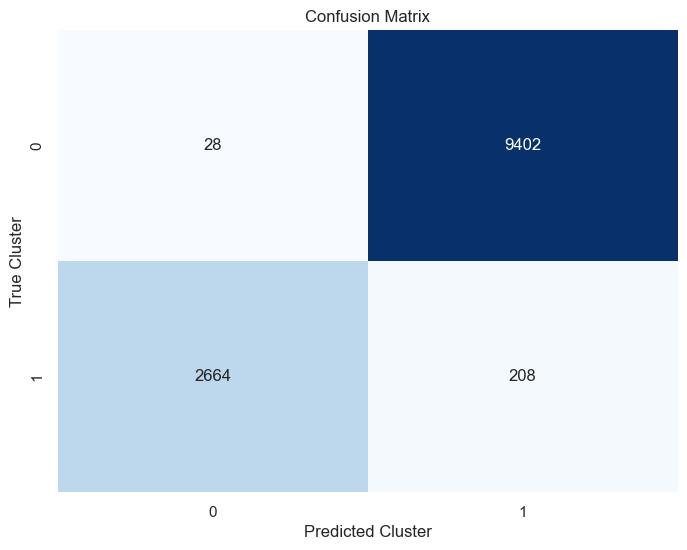

Average Silhouette Score: 0.4415


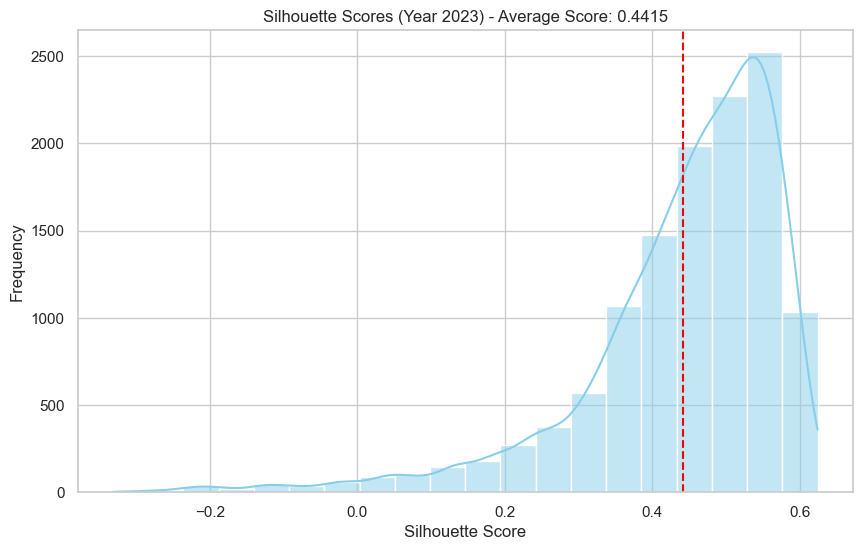

Cluster Purity for Year 2023: 0.9808
--------------------------------------------------


In [38]:
# Function to visualize dendrogram and determine clusters programmatically
def plot_dendrogram(X, max_clusters=10):
    """
    Plot the dendrogram and automatically determine the optimal number of clusters.
    """
    linkage_matrix = linkage(X, method='ward')
    
    # Create the dendrogram
    plt.figure(figsize=(10, 7))
    dendrogram(linkage_matrix, truncate_mode='lastp', p=max_clusters, show_leaf_counts=True)
    plt.title("Dendrogram for Optimal Number of Clusters")
    plt.xlabel("Samples")
    plt.ylabel("Euclidean Distance")
    plt.show()

    # Automatically determine the optimal number of clusters using silhouette score
    best_silhouette_score = -1
    optimal_clusters = 2  # Start with a minimum of 2 clusters
    for n_clusters in range(2, max_clusters + 1):
        cluster_labels = cut_tree(linkage_matrix, n_clusters=n_clusters).flatten()
        silhouette_avg = silhouette_score(X, cluster_labels)
        if silhouette_avg > best_silhouette_score:
            best_silhouette_score = silhouette_avg
            optimal_clusters = n_clusters

    print(f"Automatically selected number of clusters: {optimal_clusters} with Silhouette Score: {best_silhouette_score:.4f}")
    
    # Cut the tree at the optimal number of clusters
    cluster_labels = cut_tree(linkage_matrix, n_clusters=optimal_clusters)
    return cluster_labels.flatten(), optimal_clusters


# Perform hierarchical clustering
def perform_clustering(data, year):
    """
    Perform Agglomerative Clustering, evaluate using cluster purity, and visualize clusters with PCA.
    """
    X = data.drop(columns=['label'])  # Features (already PCA-transformed)
    y = data['label']  # True labels

    # Find optimal number of clusters from dendrogram
    cluster_labels, optimal_clusters = plot_dendrogram(X)
    
    # Fit AgglomerativeClustering with the optimal number of clusters
    agglomerative = AgglomerativeClustering(n_clusters=optimal_clusters)
    y_pred = agglomerative.fit_predict(X)

    # Calculate cluster purity
    purity = calculate_cluster_purity(y, y_pred)

    # Visualize clusters using PCA
    visualize_with_pca(X, y_pred, y, title=f"Agglomerative Cluster Visualization for {year}")

    # Visualize the confusion matrix with a heatmap
    conf_matrix = confusion_matrix(y, y_pred)
    plot_confusion_matrix(conf_matrix)
    
    # Plot silhouette scores
    plot_silhouette_scores(X, y_pred, title=f"Silhouette Scores ({year})")

    return purity, conf_matrix

# Apply clustering for each year individually
datasets = {
    "Year 2021": year_2021_pca,  # Using PCA-transformed data
    "Year 2022": year_2022_pca,  # Using PCA-transformed data
    "Year 2023": year_2023_pca,  # Using PCA-transformed data
}

for year, data in datasets.items():
    print(f"Clustering for {year}:")

    # Perform clustering for the year
    purity, conf_matrix = perform_clustering(data, year)
    print(f"Cluster Purity for {year}: {purity:.4f}")
    print("-" * 50)


# 12. DB SCAN

## 12.1. Simple Clustering

This code performs DBSCAN (Density-Based Spatial Clustering of Applications with Noise) on PCA-transformed data, evaluating the clustering quality using cluster purity and visualizations. It computes the purity and confusion matrix while filtering out noise points (label -1 in DBSCAN). The results are visualized using PCA, along with confusion matrix heatmaps and silhouette scores. For each year (2021, 2022, and 2023), the clustering process is executed, and the purity scores are printed.

Clustering for Year 2021:


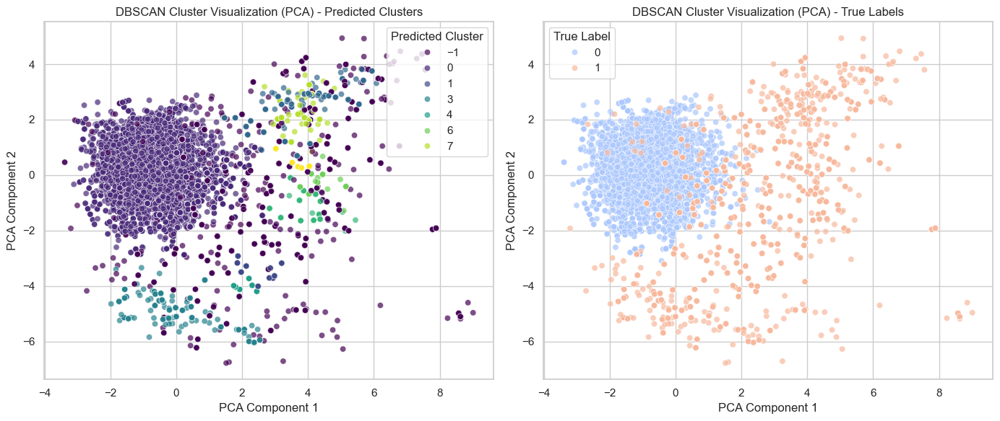

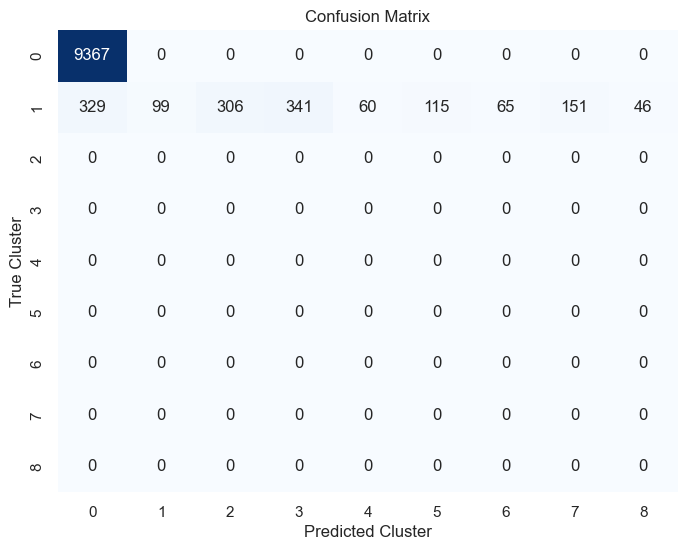

Average Silhouette Score: 0.3015


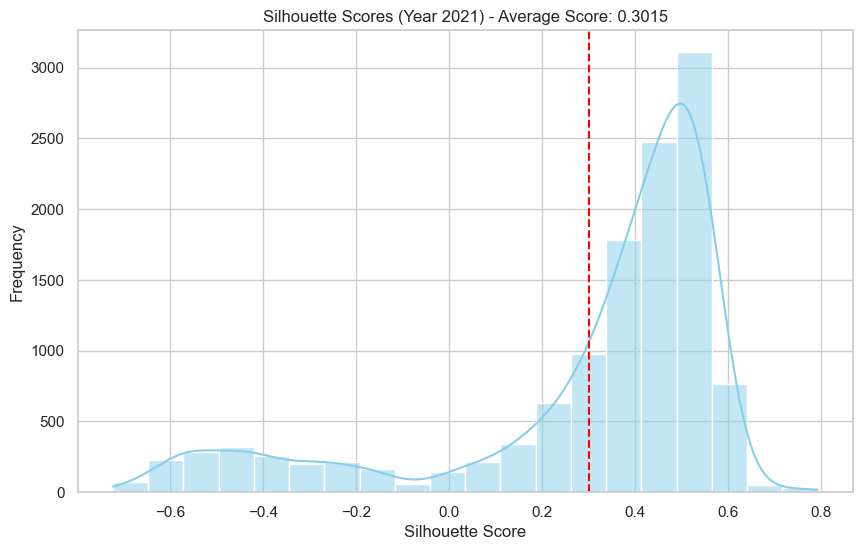

Cluster Purity for Year 2021: 0.9698
--------------------------------------------------
Clustering for Year 2022:


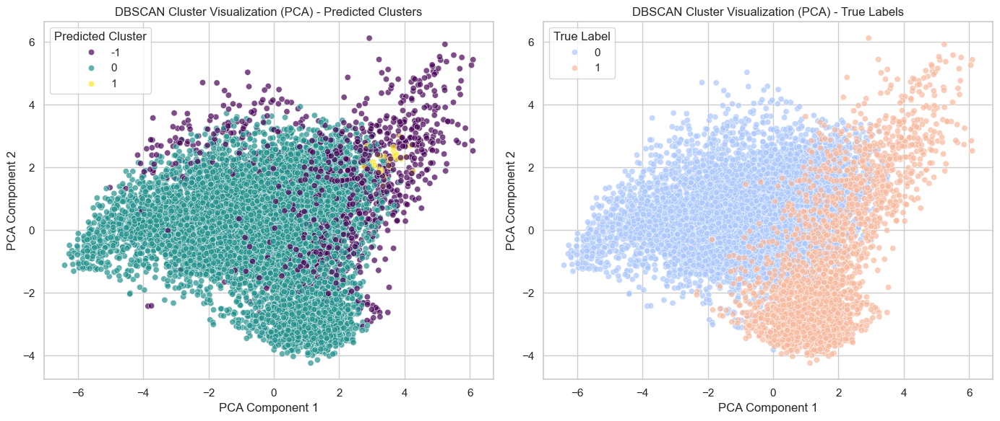

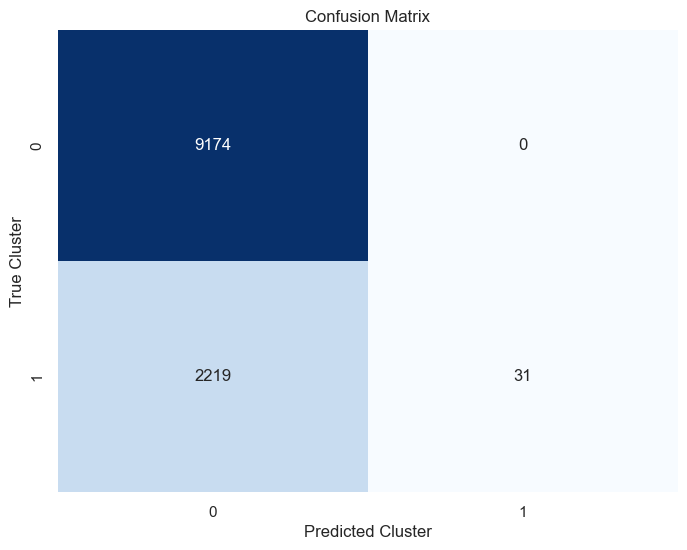

Average Silhouette Score: 0.2888


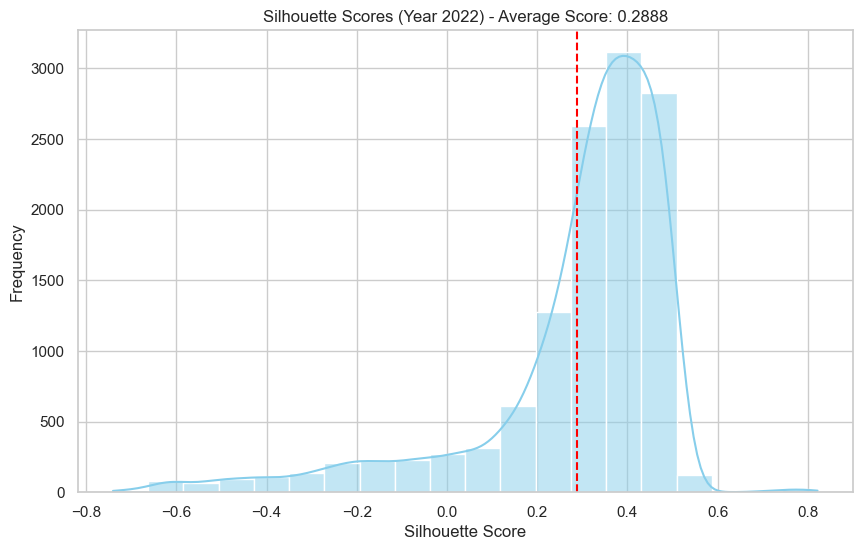

Cluster Purity for Year 2022: 0.8058
--------------------------------------------------
Clustering for Year 2023:


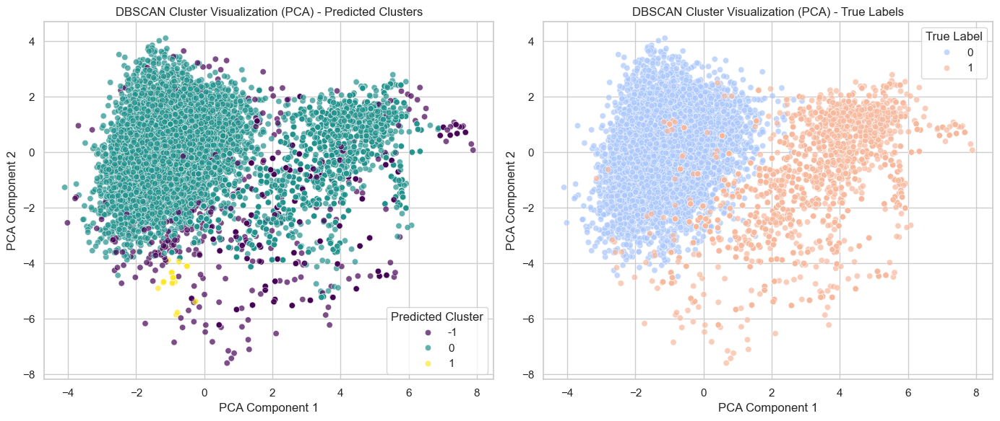

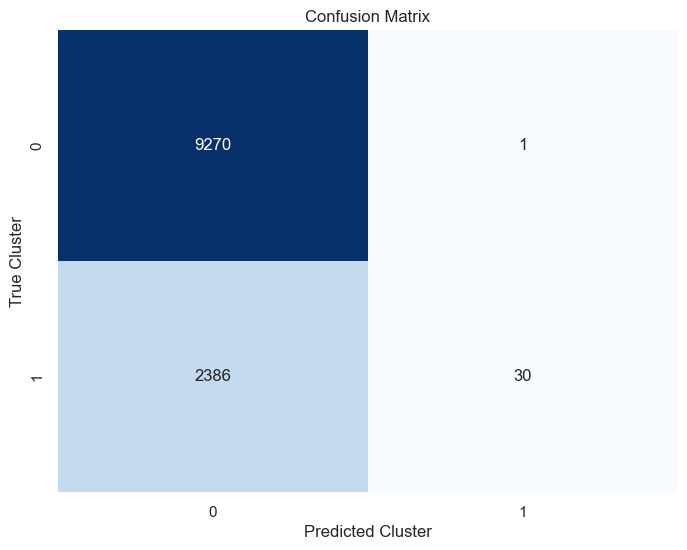

Average Silhouette Score: 0.2425


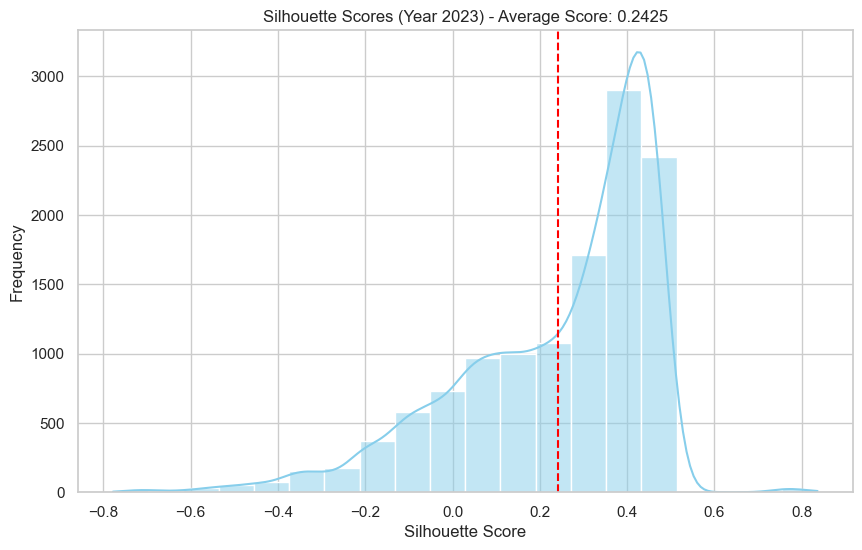

Cluster Purity for Year 2023: 0.7958
--------------------------------------------------


In [53]:
def perform_clustering(data, eps=1.2, min_samples=32):
    """
    Perform DBSCAN clustering, evaluate using cluster purity, and visualize clusters using PCA.
    """
    # Split features and labels
    X = data.drop(columns=['label'])
    y = data['label']

    # Fit DBSCAN
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    dbscan.fit(X)

    # Predict clusters for the data
    y_pred = dbscan.labels_

    # Filter out noise points (-1) for purity and confusion matrix calculation
    valid_indices = y_pred != -1
    y_valid = y[valid_indices]
    y_pred_valid = y_pred[valid_indices]

    # Calculate cluster purity if valid clusters exist
    if len(np.unique(y_pred_valid)) > 1:  # Ensure valid clusters exist
        purity = calculate_cluster_purity(y_valid, y_pred_valid)
        contingency_matrix = confusion_matrix(y_valid, y_pred_valid)
    else:
        contingency_matrix = np.zeros((len(np.unique(y)), len(np.unique(y))))  # Empty matrix, no valid clusters
        purity = 0.0  # No valid clusters, purity is 0.0

    # Visualize clusters using PCA (data is already PCA-reduced, no need to apply PCA again)
    visualize_with_pca(X, y, y_pred, title="DBSCAN Cluster Visualization (PCA)")

    # Visualize the confusion matrix with a heatmap
    plot_confusion_matrix(contingency_matrix)
    
    # Plot silhouette scores
    plot_silhouette_scores(X, y_pred, title=f"Silhouette Scores ({year})")

    return purity, contingency_matrix

# Datasets for the years 2021, 2022, and 2023 (already PCA-transformed datasets)
datasets = {
    "Year 2021": year_2021_pca,  # PCA-transformed data
    "Year 2022": year_2022_pca,
    "Year 2023": year_2023_pca,
}

# Perform clustering for each year independently
for year, data in datasets.items():
    print(f"Clustering for {year}:")

    # Perform clustering for the year
    purity, conf_matrix = perform_clustering(data, eps=1.2, min_samples=32)
    print(f"Cluster Purity for {year}: {purity:.4f}")
    print("-" * 50)


## 12.2. Grid Search Clustering

Your code performs DBSCAN clustering with a grid search over eps and min_samples for each year, selecting the parameters that maximize cluster purity. It visualizes the best clusters using PCA, confusion matrix, and silhouette scores. Adjust the grid search ranges for better exploration of parameter values.

Clustering for Year 2021:


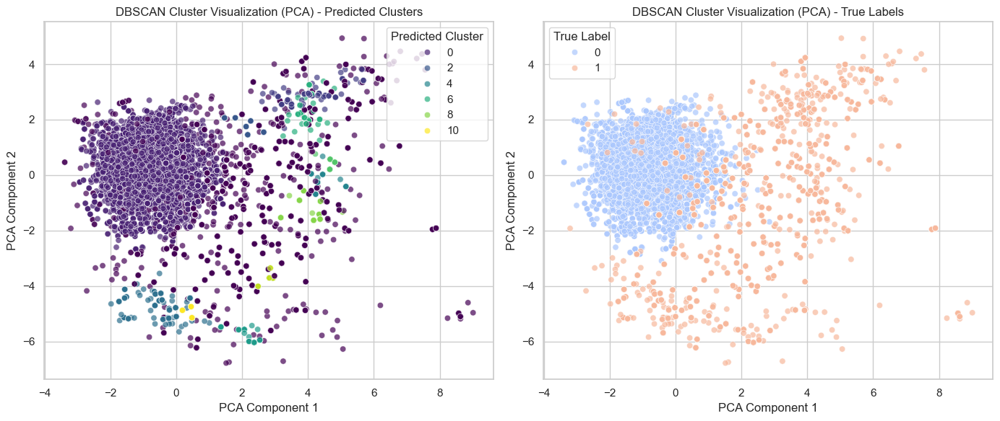

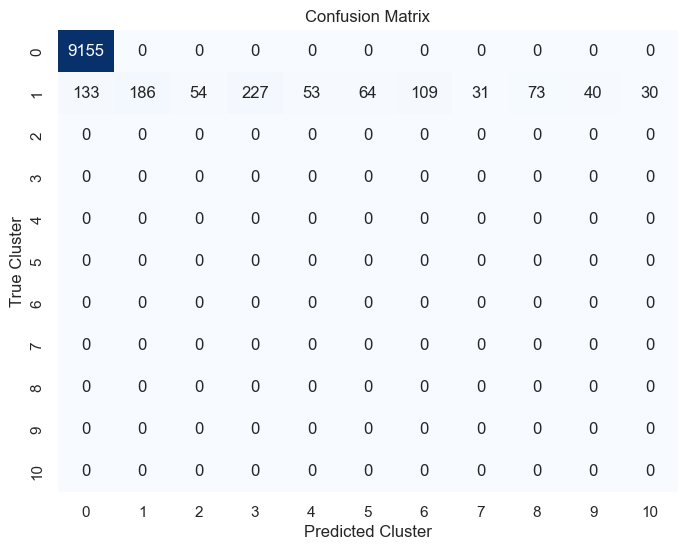

Average Silhouette Score: 0.2407


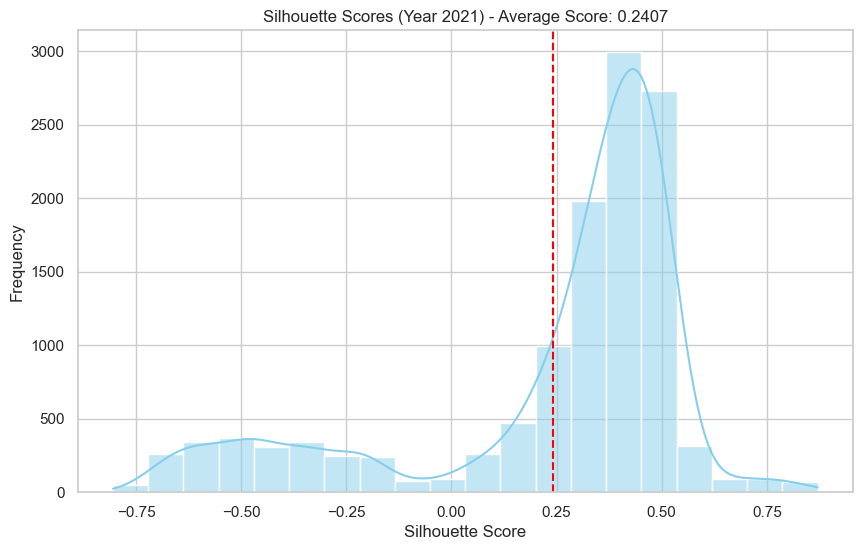

Best Purity for Year 2021: 0.9869
Best Parameters for Year 2021: {'eps': np.float64(1.0), 'min_samples': 31}
--------------------------------------------------
Clustering for Year 2022:


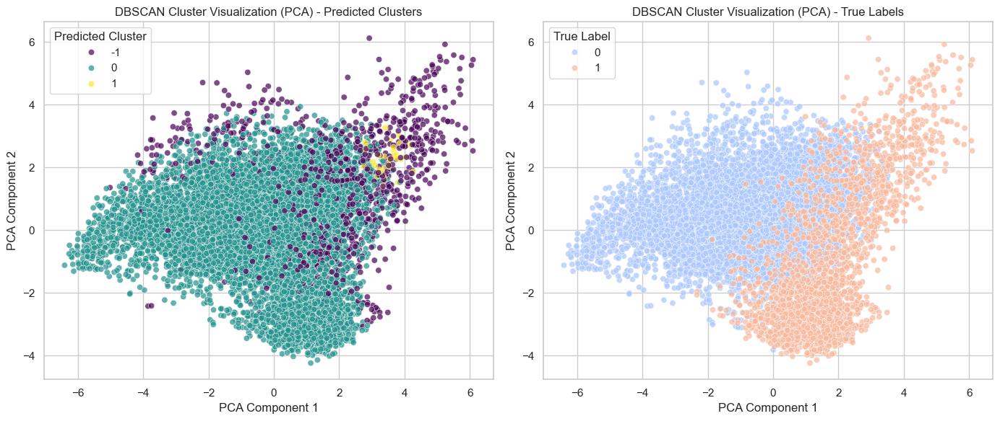

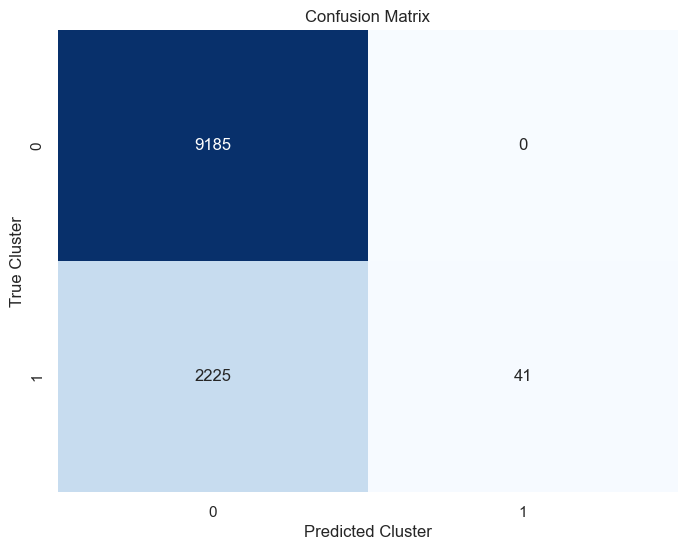

Average Silhouette Score: 0.2497


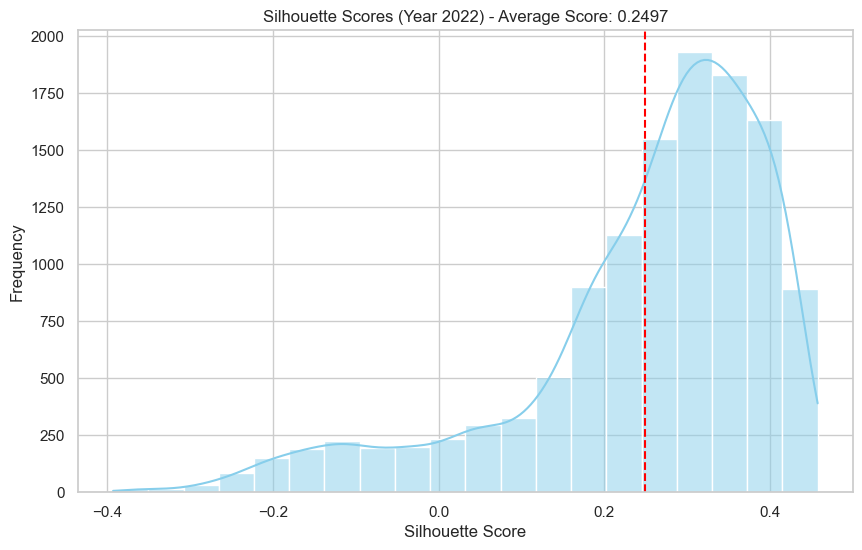

Best Purity for Year 2022: 0.8057
Best Parameters for Year 2022: {'eps': np.float64(1.2), 'min_samples': 31}
--------------------------------------------------
Clustering for Year 2023:


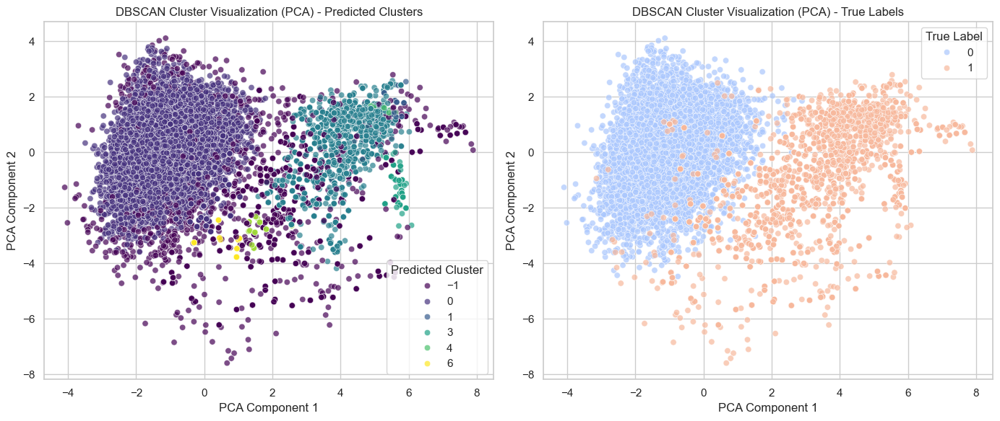

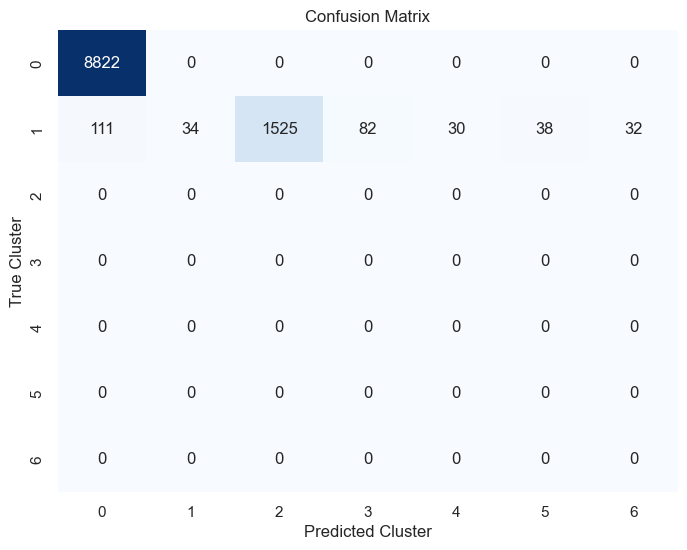

Average Silhouette Score: 0.2059


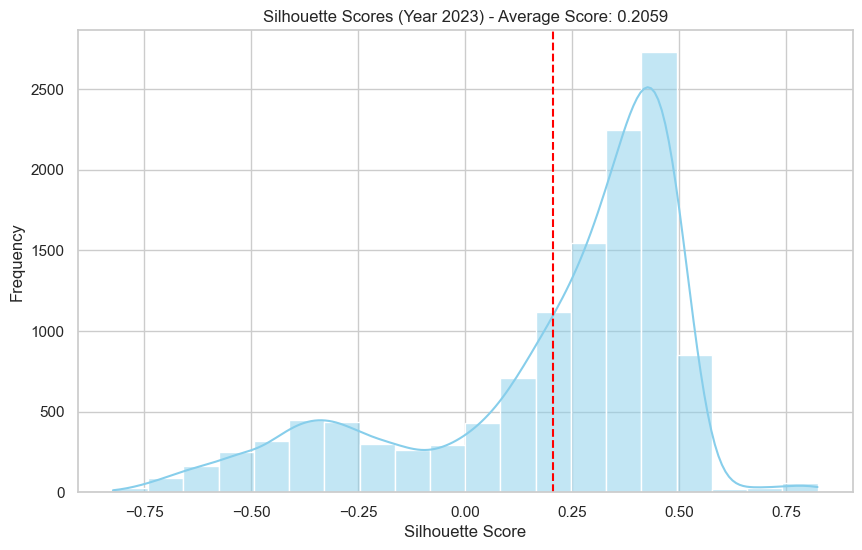

Best Purity for Year 2023: 0.9896
Best Parameters for Year 2023: {'eps': np.float64(1.0), 'min_samples': 31}
--------------------------------------------------


In [76]:
def perform_clustering_with_grid_search(data, eps_range, min_samples_range):
    """
    Perform DBSCAN clustering with grid search over eps and min_samples.
    Evaluate using cluster purity and visualize clusters using PCA.
    """
    # Split features and labels
    X = data.drop(columns=['label'])
    y = data['label']

    best_purity = 0.0
    best_params = None
    best_contingency_matrix = None
    best_y_pred = None

    # Grid search over eps and min_samples
    for eps in eps_range:
        for min_samples in min_samples_range:
            # Fit DBSCAN
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            dbscan.fit(X)

            # Predict clusters
            y_pred = dbscan.labels_

            # Filter out noise points (-1) for purity calculation
            valid_indices = y_pred != -1
            y_valid = y[valid_indices]
            y_pred_valid = y_pred[valid_indices]

            # Calculate cluster purity if valid clusters exist
            if len(np.unique(y_pred_valid)) > 1:
                contingency_matrix = confusion_matrix(y_valid, y_pred_valid)
                purity = calculate_cluster_purity(y_valid, y_pred_valid)

                if purity > best_purity:
                    best_purity = purity
                    best_params = {'eps': eps, 'min_samples': min_samples}
                    best_contingency_matrix = contingency_matrix
                    best_y_pred = y_pred

    # Visualize best clusters using PCA
    if best_y_pred is not None:
        visualize_with_pca(X, y, best_y_pred, title="DBSCAN Cluster Visualization (PCA)")
        plot_confusion_matrix(best_contingency_matrix)
        # Plot silhouette scores
        plot_silhouette_scores(X, y_pred, title=f"Silhouette Scores ({year})")
    else:
        print("No valid clusters found with the given parameter ranges.")

    return best_purity, best_params, best_contingency_matrix

# Datasets for the years 2021, 2022, and 2023
datasets = {
    "Year 2021": year_2021_pca,
    "Year 2022": year_2022_pca,
    "Year 2023": year_2023_pca,
}

# Perform clustering for each year independently with grid search
for year, data in datasets.items():
    print(f"Clustering for {year}:")

    # Set grid search ranges for DBSCAN parameters
    eps_range = np.linspace(1.2, 1.0, 5)  # Example range for eps
    min_samples_range = range(31, 32, 30)   # Example range for min_samples
    
    best_purity, best_params, best_conf_matrix = perform_clustering_with_grid_search(
        data, eps_range, min_samples_range
    )
    print(f"Best Purity for {year}: {best_purity:.4f}")
    print(f"Best Parameters for {year}: {best_params}")
    print("-" * 50)

# 13. Gaussian Mixture Models

## 13.1. Simple Clustering

The code provided performs Gaussian Mixture Model (GMM) clustering on PCA-transformed datasets for each year (2021, 2022, and 2023). It calculates the cluster purity, visualizes clusters with PCA, and generates confusion matrices and silhouette scores for evaluation. The clustering process is executed for each dataset independently, printing the purity and confusion matrix for each year. You may want to adjust n_clusters to match the optimal number of clusters if needed.

Clustering for Year 2021:


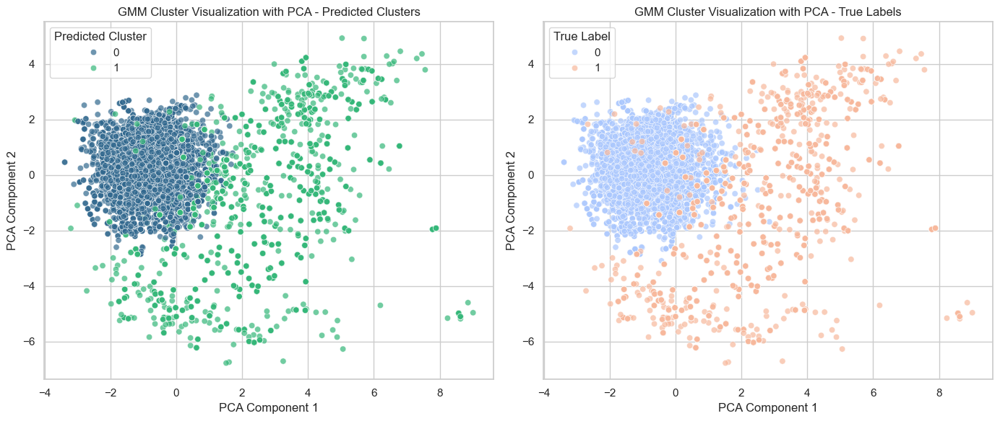

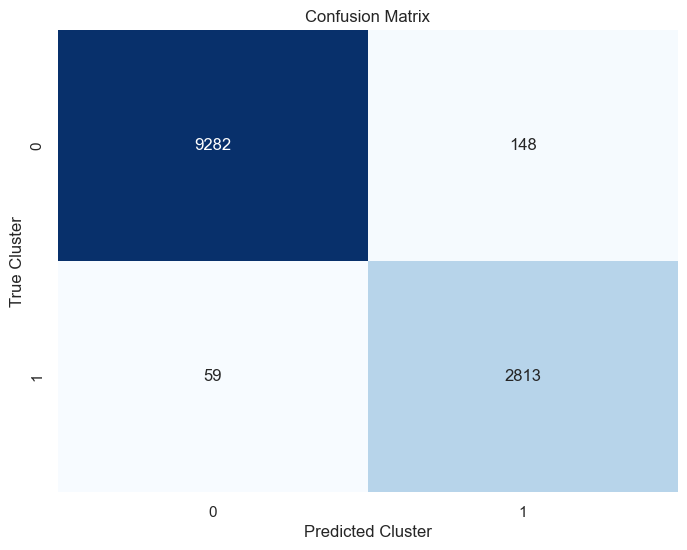

Average Silhouette Score: 0.3974


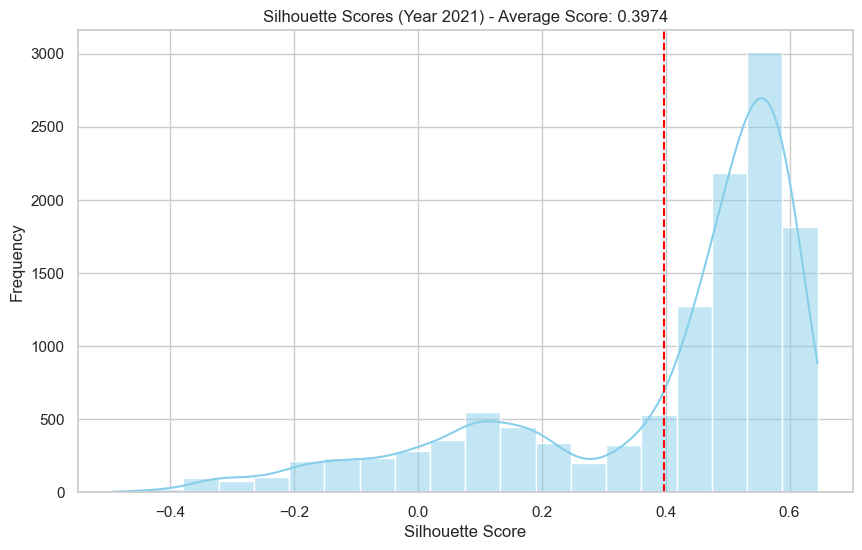

Cluster Purity for Year 2021: 0.9832
--------------------------------------------------
Clustering for Year 2022:


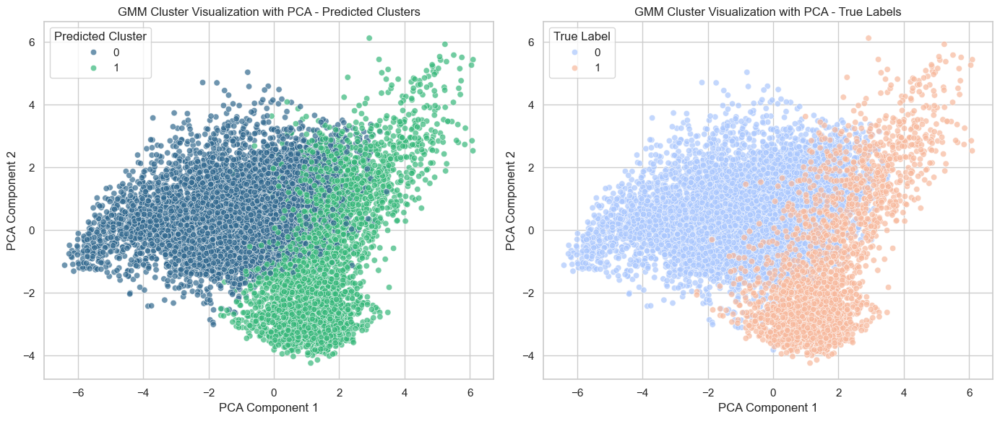

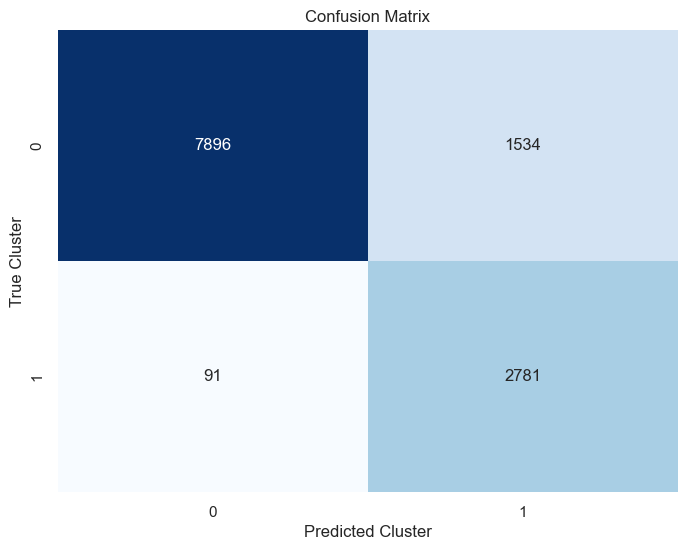

Average Silhouette Score: 0.2147


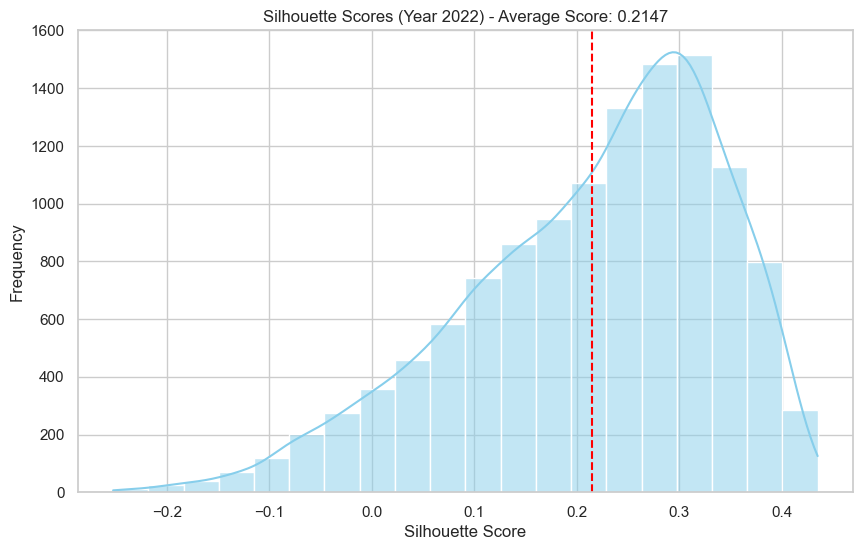

Cluster Purity for Year 2022: 0.8679
--------------------------------------------------
Clustering for Year 2023:


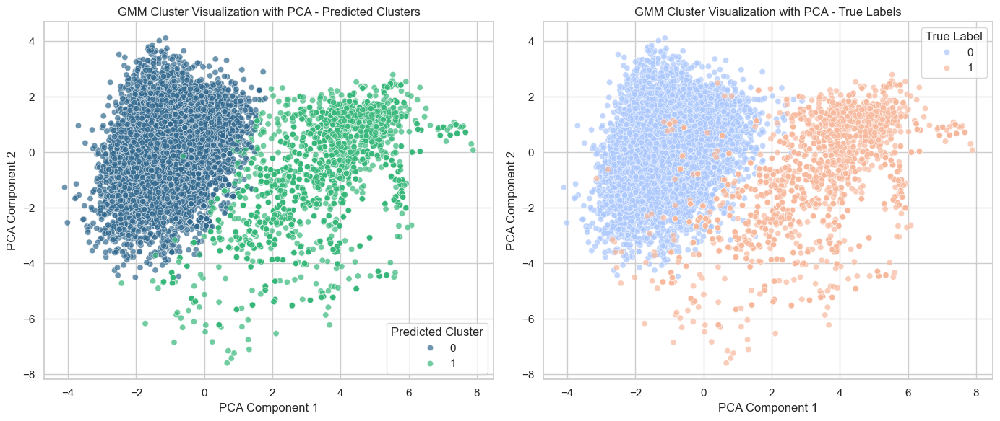

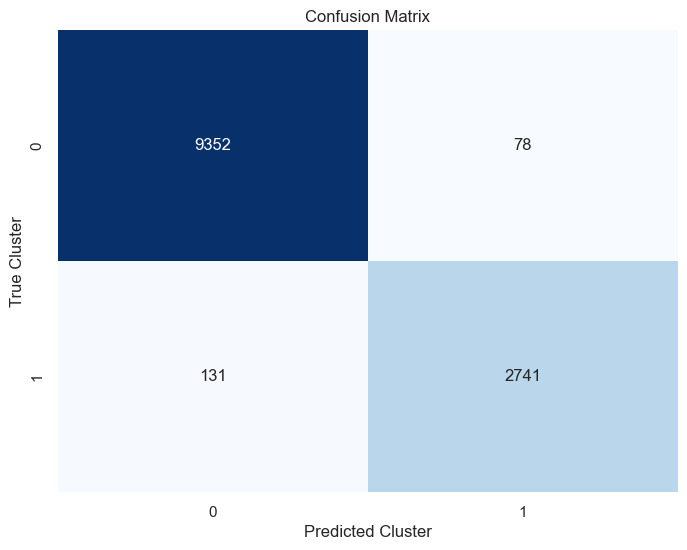

Average Silhouette Score: 0.4380


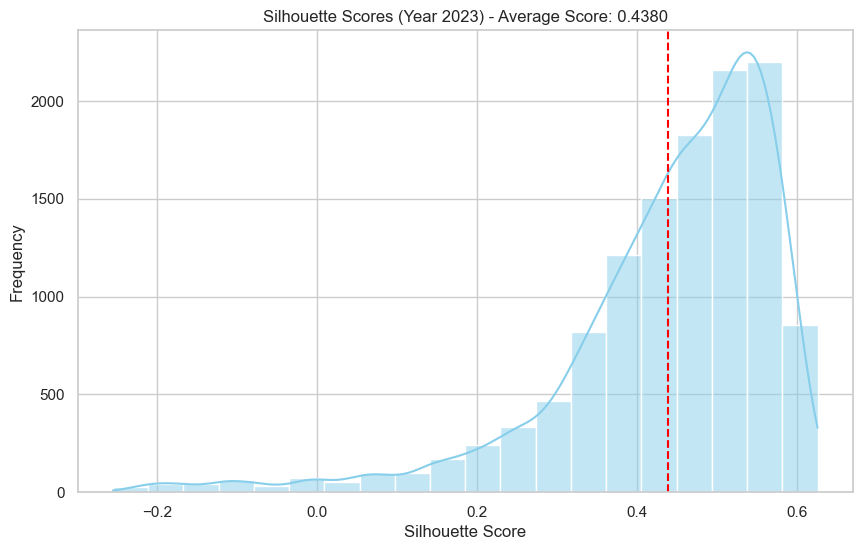

Cluster Purity for Year 2023: 0.9830
--------------------------------------------------


In [77]:
def perform_clustering(data, n_clusters=2):
    """
    Perform Gaussian Mixture Model clustering, evaluate using cluster purity, and visualize clusters.
    """
    # Split features and labels
    X = data.drop(columns=['label'])
    y = data['label']

    # Fit Gaussian Mixture Model
    gmm = GaussianMixture(n_components=n_clusters, random_state=42)
    gmm.fit(X)

    # Predict clusters
    y_pred = gmm.predict(X)

    # Calculate cluster purity
    contingency_matrix = confusion_matrix(y, y_pred)
    purity = calculate_cluster_purity(y, y_pred)

    # Visualize clusters with PCA
    visualize_with_pca(X, y, y_pred, title="GMM Cluster Visualization with PCA")

    # Visualize confusion matrix
    plot_confusion_matrix(contingency_matrix)
    
    # Plot silhouette scores
    plot_silhouette_scores(X, y_pred, title=f"Silhouette Scores ({year})")

    return purity, contingency_matrix

# Datasets for the years 2021, 2022, and 2023
datasets = {
    "Year 2021": year_2021_pca,
    "Year 2022": year_2022_pca,
    "Year 2023": year_2023_pca,
}

# Perform clustering for each year independently
for year, data in datasets.items():
    print(f"Clustering for {year}:")

    # Perform clustering with Gaussian Mixture Model for the current year
    purity, conf_matrix = perform_clustering(data, n_clusters=2)
    print(f"Cluster Purity for {year}: {purity:.4f}")
    print("-" * 50)

## 13.2. Grid Search Clustering

The code performs grid search for Gaussian Mixture Model (GMM) clustering with varying n_clusters, evaluating each model based on cluster purity. It then visualizes the best clustering results using PCA, plots the confusion matrix, and silhouette scores for each dataset (2021, 2022, and 2023).








Clustering for Year 2021:
Best Purity: 0.9847 with 5 clusters



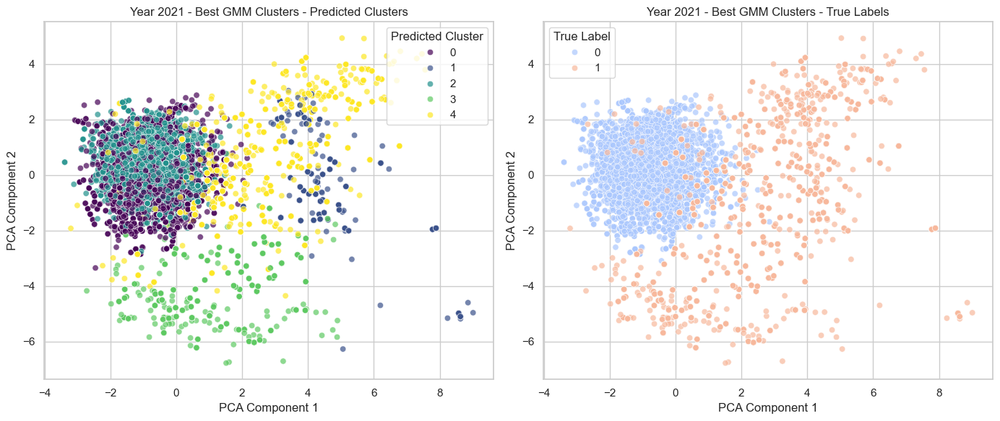

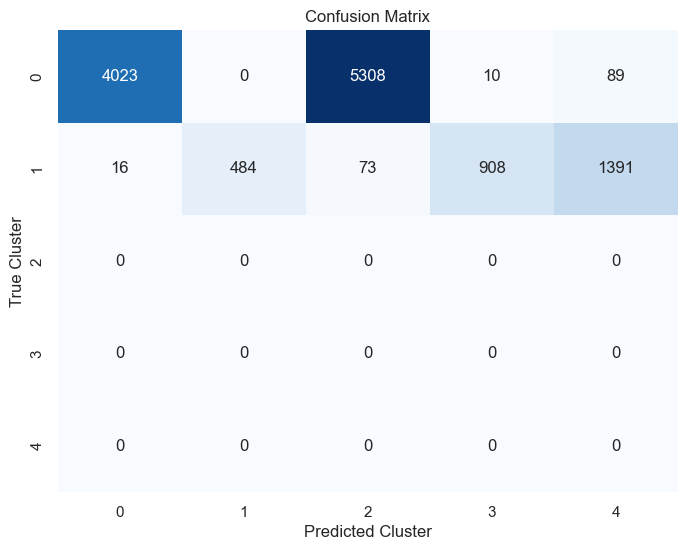

Average Silhouette Score: 0.1466


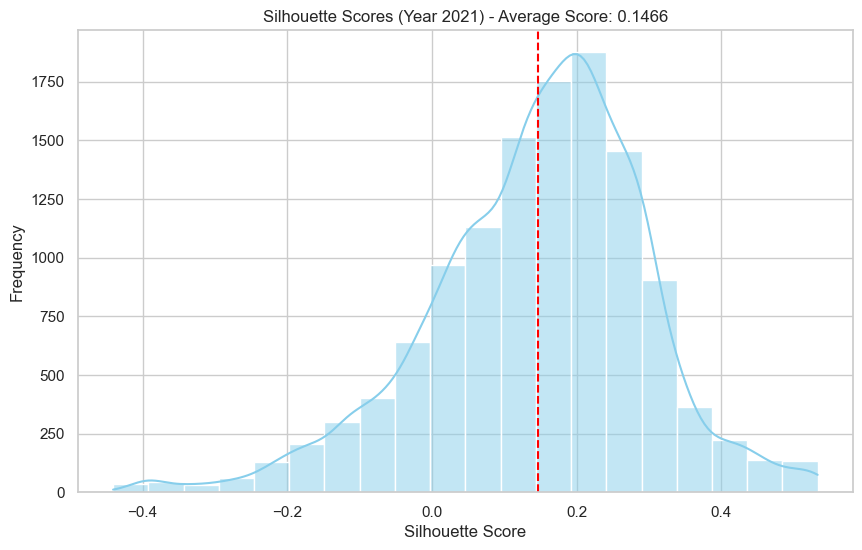

Final Cluster Purity for Year 2021: 0.9847
--------------------------------------------------
Clustering for Year 2022:
Best Purity: 0.9581 with 4 clusters



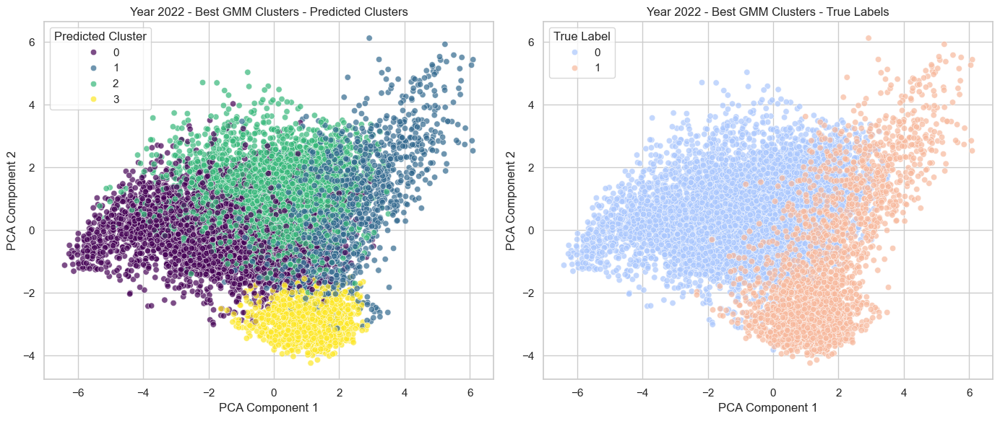

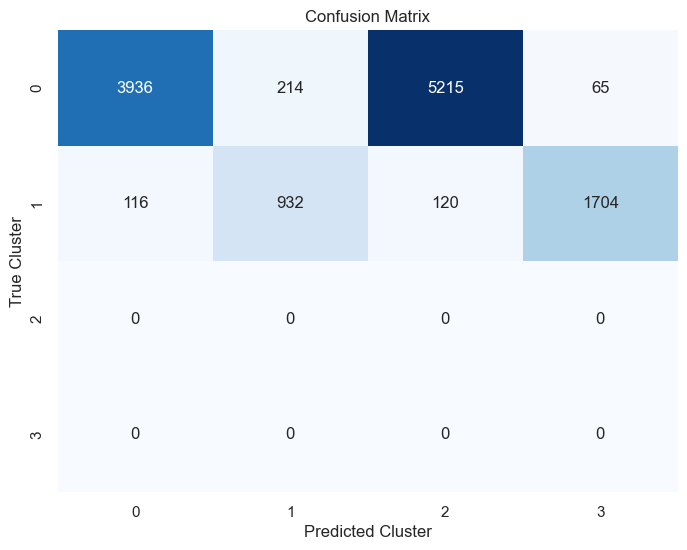

Average Silhouette Score: 0.1916


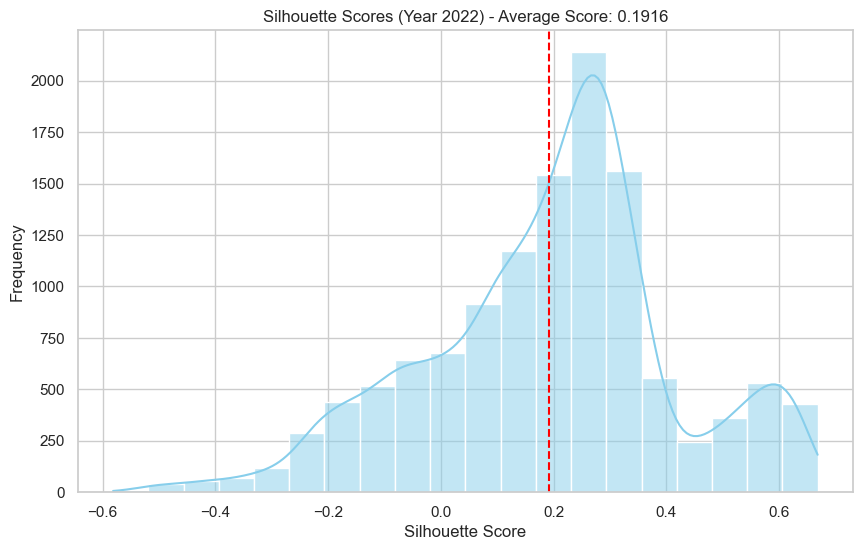

Final Cluster Purity for Year 2022: 0.9581
--------------------------------------------------
Clustering for Year 2023:
Best Purity: 0.9865 with 5 clusters



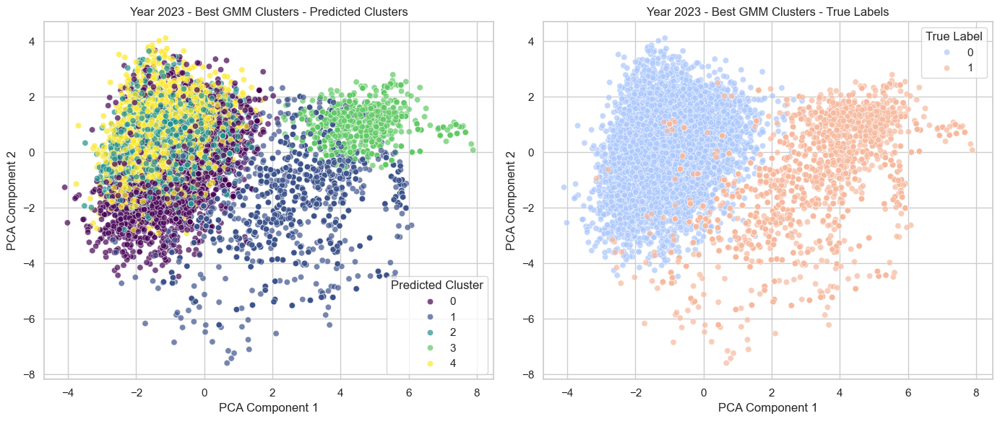

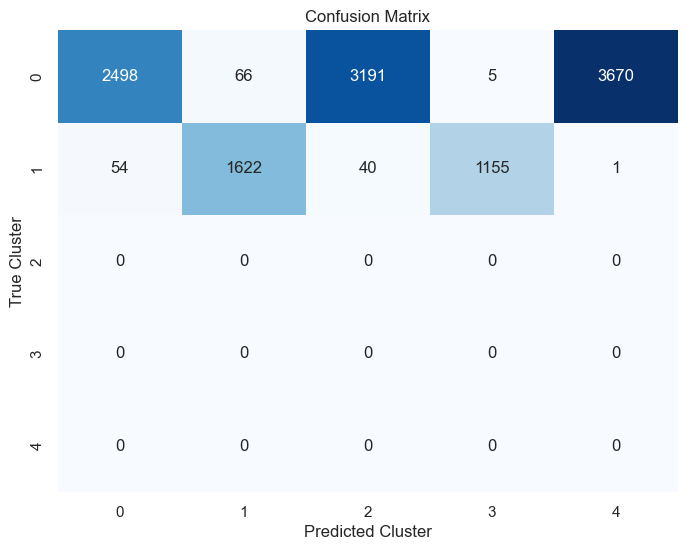

Average Silhouette Score: 0.1549


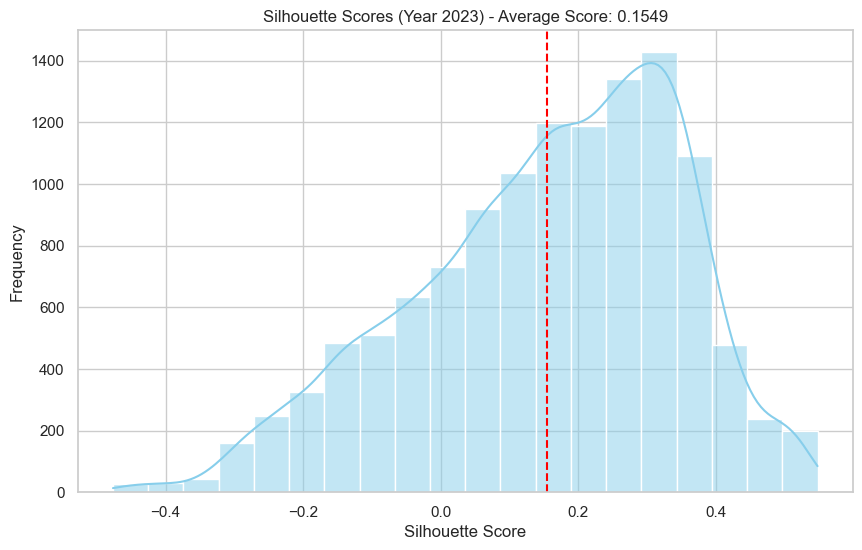

Final Cluster Purity for Year 2023: 0.9865
--------------------------------------------------


In [78]:
def perform_clustering_with_grid_search(data, n_clusters_grid):
    """
    Perform grid search for Gaussian Mixture Model clustering, 
    evaluate using cluster purity, and return best model.
    """
    # Split features and labels
    X = data.drop(columns=['label'])
    y = data['label']

    best_purity = 0
    best_n_clusters = None
    best_model = None
    best_confusion_matrix = None

    # Grid search over cluster numbers
    for n_clusters in n_clusters_grid:
        gmm = GaussianMixture(n_components=n_clusters, random_state=42)
        gmm.fit(X)
        y_pred = gmm.predict(X)

        # Calculate cluster purity
        conf_matrix = confusion_matrix(y, y_pred)
        purity = calculate_cluster_purity(y, y_pred)

        if purity > best_purity:
            best_purity = purity
            best_n_clusters = n_clusters
            best_model = gmm
            best_confusion_matrix = conf_matrix

    print(f"Best Purity: {best_purity:.4f} with {best_n_clusters} clusters\n")
    return best_model, best_purity, best_n_clusters, best_confusion_matrix

# Define datasets
datasets = {
    "Year 2021": year_2021_pca,
    "Year 2022": year_2022_pca,
    "Year 2023": year_2023_pca,
}

# Define grid search range for n_clusters
n_clusters_grid = [2, 3, 4, 5]

# Perform clustering for each year
for year, data in datasets.items():
    print(f"Clustering for {year}:")
    best_model, best_purity, best_n_clusters, best_conf_matrix = perform_clustering_with_grid_search(
        data, n_clusters_grid)

    # Predict using the best model
    X = data.drop(columns=['label'])
    y = data['label']
    y_pred = best_model.predict(X)

    # Visualization and results
    visualize_with_pca(X, y, y_pred, title=f"{year} - Best GMM Clusters")
    plot_confusion_matrix(best_conf_matrix)
    # Plot silhouette scores
    plot_silhouette_scores(X, y_pred, title=f"Silhouette Scores ({year})")
    print(f"Final Cluster Purity for {year}: {best_purity:.4f}")
    print("-" * 50)